In [1]:
import numpy as np
import cv2
from skimage import io
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import matplotlib.pyplot as plt
%matplotlib inline


def get_obj2img_rate():
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    return xm_per_pix,ym_per_pix

def get_obj2img_points():

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    #images = glob.glob('../camera_cal/calibration*.jpg')
    images = glob.glob('./camera_cal/calibration*.jpg')
    images.sort()
    #print(images)
    # Step through the list and search for chessboard corners
    
    ret_images=[]
    for fname in images:
        img = io.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
        #print(corners.shape)

        # If found, add object points, image points
        if ret == True:
            ret_images.append(fname)
            objpoints.append(objp)
            imgpoints.append(corners)

            #plt.figure()    
            #c_img = cv2.drawChessboardCorners(img, (9,6),corners, ret)
            #plt.imshow(c_img)
            #plt.title(fname)
            #plt.show()
        else:
            print('fault',fname)
            
    #print(len(imgpoints))
    return len(ret_images)>0,ret_images,objpoints,imgpoints



def get_cal_undistort_param(img_size , objpoints, imgpoints):
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
   
    return ret,mtx,dist



gbl_img_sizeX = -1
gbl_img_sizeY = -1


def get_list_img_sizeXY():
    global gbl_img_sizeX
    global gbl_img_sizeY
    
    if(gbl_img_sizeX<=0):
        img = io.imread('./camera_cal/calibration1.jpg')
        gbl_img_sizeX=img.shape[1]
        gbl_img_sizeY=img.shape[0]
     
    img_size=[gbl_img_sizeX,gbl_img_sizeY]
    
    return img_size    
 
def get_list_img_sizeYX():
    global gbl_img_sizeX
    global gbl_img_sizeY
    
    if(gbl_img_sizeX<=0):
        img = io.imread('./camera_cal/calibration1.jpg')
        gbl_img_sizeX=img.shape[1]
        gbl_img_sizeY=img.shape[0]
     
    img_size=[gbl_img_sizeY,gbl_img_sizeX]
    
    return img_size    

def get_tuple_img_sizeYX():
    global gbl_img_sizeX
    global gbl_img_sizeY
    
    if(gbl_img_sizeX<=0):
        img = io.imread('./camera_cal/calibration1.jpg')
        gbl_img_sizeX=img.shape[1]
        gbl_img_sizeY=img.shape[0]
    
    img_size=(gbl_img_sizeY,gbl_img_sizeX)
    
    return img_size    

def get_tuple_img_sizeXY():
    global gbl_img_sizeX
    global gbl_img_sizeY
    
    if(gbl_img_sizeX<=0):
        img = io.imread('./camera_cal/calibration1.jpg')
        gbl_img_sizeX=img.shape[1]
        gbl_img_sizeY=img.shape[0]
    
    img_size=(gbl_img_sizeX,gbl_img_sizeY)
    
    return img_size      

In [2]:
#get_obj2img_points()
#plt.show()

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline



def get_points_for_warp_operation(img_size):
    src = np.float32(
        [[(img_size[1] / 2) - 55 - 2, img_size[0] / 2 + 100], 
        [((img_size[1] / 6) - 10), img_size[0]], 
        [(img_size[1] * 5 / 6) + 35, img_size[0]], 
        [(img_size[1] / 2 + 55 + 6), img_size[0] / 2 + 100]])
    dst = np.float32(
        [[(img_size[1] / 4), 0], 
        [(img_size[1] / 4), img_size[0]], 
        [(img_size[1] * 3 / 4), img_size[0]], 
        [(img_size[1] * 3 / 4), 0]])
    return src,dst


def draw_lines_for_warp_operation(undist,warped,src,dst):
    disp=[undist,warped]
    
    s=src
    s=np.append(s,src[0])
    s=np.resize(s,(5,2))
    print('src.shape',src.shape,'s.shape',s.shape)
    d=dst
    d=np.append(d,dst[0])
    d=np.resize(d,(5,2))
    for k in range(4):
        cv2.line(disp[0],tuple(s[k]) ,tuple(s[k+1]), (0, 0, 255), 2)
        cv2.line(disp[1],tuple(d[k]) ,tuple(d[k+1]), (0, 0, 255), 2)
            
    plt.figure(figsize=(16,5))
    f, (ax1, ax2) = plt.subplots(1,2,figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(disp[0])
    #ax1.set_title('Original Image', fontsize=50)　　★Mentor指摘
    ax1.set_title('undist Image', fontsize=50)
    ax2.imshow(disp[1])
    ax2.set_title('warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    


In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline


# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.

import matplotlib.pyplot as plt

def abs_sobel_thresh(img_src, orient='x', thresh_min=0, thresh_max=255):
#ソーベルと2値化    
    
    H=img_src.shape[0]
    W=img_src.shape[1]
    R=4
    h=H//R
    w=W//R
    
    ximg=cv2.resize(img_src,(w,h),cv2.INTER_LANCZOS4)
    
    img = cv2.medianBlur(ximg, ksize=5)
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=7))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    
    # 6) Return this mask as your binary_output image
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
   

    result=cv2.resize(binary_output,(W,H))
    
    ################################################## 
    #plt.figure(figsize=(15, 5))
    #plt.imshow(binary_output) 
    #binary_output = np.copy(img) # Remove this line
    return result

def  image_decolor_plus(img , N , area):
#減色を用いたレーン検出処理    
    H=img.shape[0]
    W=img.shape[1]
    R=6
    h=H//R
    w=W//R
    
    ximg=cv2.resize(img,(w,h),cv2.INTER_LANCZOS4)
    ximg[h-10:h,:]*=0
    t=0.25
    if t>0:
        op = np.array([[-t, -t, -t], [-t, 1+8*t, -t], [-t, -t, -t]])
        ximg = cv2.filter2D(ximg, ddepth=-1, kernel=op)
        
    img_src=ximg.copy()
    #img_src = cv2.fastNlMeansDenoisingColored(ximg,None,10,10,7,21)

    Z = img_src.reshape((-1,3))

    # float32に変換
    Z = np.float32(Z)
    # K-Means法
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    K = N
    ret,label,center=cv2.kmeans(Z,
                              K,
                              None,
                              criteria,
                              10,
                              #cv2.KMEANS_RANDOM_CENTERS
                              cv2.KMEANS_PP_CENTERS)
   
    center = np.uint8(center)
    res = center[label.flatten()]
    dst = res.reshape((img_src.shape))
    dst=cv2.resize(dst,(W,H))
    
    ##検出ラベルごとの画素数確認
    result=[]
    for i in range(K):
        result.append(np.sum(label==i))
        #print(result[i])
        
    #print(img.shape,np.sum(result)/img.shape[0])
    #行と列数にずれなきこと確認
    # print(center)
  
    
    mysliding=32
    #area=50000
    
   
    #面積と輝度を確認して排除
    for i in range(K):
        delsize=area//(R*R)
        if(result[i]>delsize):
            center[i]*=0
            continue
            
        g=center[i][0]*0.299+center[i][1]*0.587+center[i][2]*0.114
        if(g<128):
            center[i]*=0 
        
    #print(label.shape)    
    test=label.copy()
    test=test.reshape(h,w)
    
        
    #print(test.shape)   
    #横方向の連なりを確認して排除
    for i in range(K):
        #sliding windows 
        if(all(center[i]==0)):
            continue
            
        half=mysliding//2
        
        xtest=np.sum(test==i, axis=1)
       
        for j in range(half,h,half):
            t= j-half
            b= j+half
            if(t<0):
                continue
            if(b>=h):    
                continue
            cnt=(np.sum(xtest[t:b]))
            if(cnt>w*2):
                center[i]*=0
                break
                
    #print(center)
    
    # UINT8に変換
    center = np.uint8(center)
    res = center[label.flatten()]
    ximg_dst = res.reshape((img_src.shape))
    
    img_dst=cv2.resize(ximg_dst,(W,H))
    #plt.figure(figsize=(15, 5))
    #plt.imshow(img_dst) 
    
    img_dst[H-80:H,:]*=0
    
    return img_dst,dst


def  image_decolor_debug(img , N):    
    h=img.shape[0]
    w=img.shape[1]
    
    H=[0,h//4,h//2,h//4+h//2,h]
    
    img1=img.copy()
    img2=img[0:h//4,:].copy()
    
    de1,d1=image_decolor_plus(img1 , N   ,50000)
    de2,d2=image_decolor_plus(img2 , N//2,50000//32)
    
    mask=de1[0:h//4,:]==[0,0,0]
    
    de1[0:h//4,:]=de1[0:h//4,:]+de2*mask
    
    
    return de1,d1
    

def  image_decolor(img , N):
     de1,d1=image_decolor_debug(img , N)    
     
     return de1
    

./test_warps/warp1.jpg
./test_warps/warp2.jpg
./test_warps/warp3.jpg
./test_warps/warp4.jpg
./test_warps/warp5.jpg
./test_warps/warp6.jpg


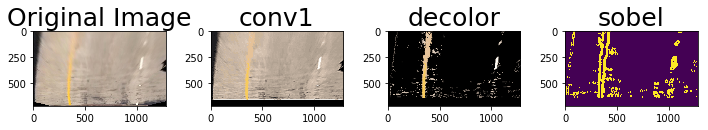

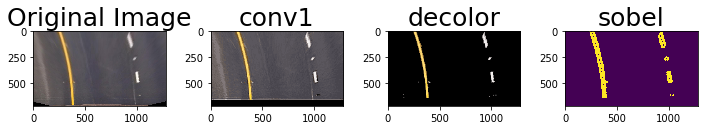

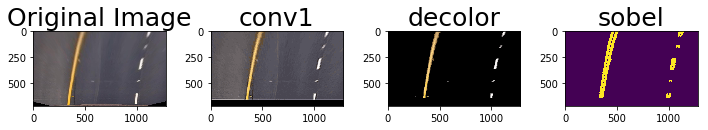

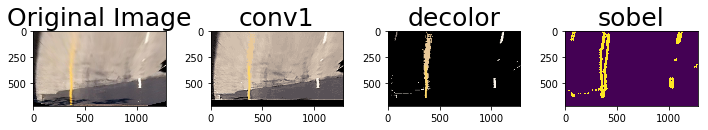

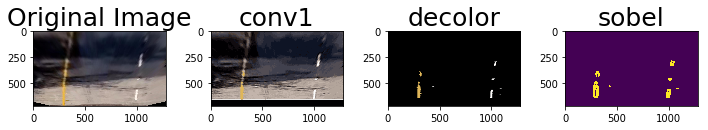

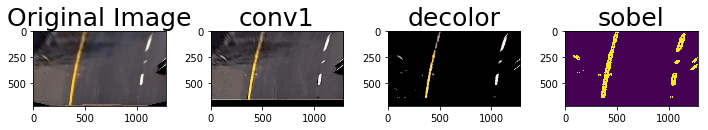

In [5]:

from skimage import io    
import glob

usig_raw_img =False

if usig_raw_img:
    sight=glob.glob('./test/*.png')
else:
    sight=glob.glob('./test_warps/warp*.jpg')

sight.sort()

#sight=sight[0:4]
for fname in sight:
    print(fname)
    img=io.imread(fname)

    if usig_raw_img:
        undist, warped=unwarp(img,mtx,dist,M)
        img=warped


    declr,i= image_decolor_debug(img, 16);

    f, (ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(10, 6))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(i)
    ax2.set_title('conv1', fontsize=25)
    ax3.imshow(declr)
    ax3.set_title('decolor', fontsize=25)

    edge=abs_sobel_thresh(declr, 'x', 12, 255)
    ax4.imshow(edge)
    ax4.set_title('sobel', fontsize=25)
    

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

def get_M_Matrix():
#★ひずみ補正画像系をワープ画像上の座標系に変換する行列    
    img_size=get_tuple_img_sizeYX()
    src , dst =get_points_for_warp_operation(img_size)
    
    
    #print(src)
    #print('----------------------')
    #print(dst)
    #print('----------------------')
    M = cv2.getPerspectiveTransform(src, dst)
    #print('----------------------')
    #print('M',M)
    #print('----------------------')
    
    return M,src,dst

def get_iM_Matrix():
#★ワープ画像上の座標系をひずみ補正画像系に変換する行列
    img_size=get_tuple_img_sizeYX()
    src , dst =get_points_for_warp_operation(img_size)
    
    
    #print(src)
    #print('----------------------')
    #print(dst)
    #print('----------------------')
    iM = cv2.getPerspectiveTransform(dst,src)
    #print('----------------------')
    #print('M',M)
    #print('----------------------')
    
    return iM,src,dst


def unwarp(img,  mtx, dist ,M):
#★入力画像（ひずみ補正前）をワープ画像に変換する
    
    # Use the OpenCV undistort() function to remove distortion
    undist = img.copy()
    undist = cv2.undistort(undist, mtx, dist, None, mtx)
    
    
    #img_size = (gray.shape[1], gray.shape[0])
    img_size=get_tuple_img_sizeXY()


    warped = undist.copy()
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(warped, M, img_size)
    return undist, warped


import numpy as np
def get_warped_histogram_pack(warped):
#★ワープ画像からヒストグラムと左右ヒストグラムピーク位置を求める
    gray=warped.copy() 
    if(len(warped.shape)==3):
        if(warped.shape[2]==3):          #修正2017.1.25
            gray = cv2.cvtColor(gray, cv2.COLOR_RGB2GRAY)
        
    histogram = np.sum(gray[gray.shape[0]//2:,:], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    
    avg=np.mean(histogram)
    err=0
    if histogram[leftx_base] <(avg*12)//10:
        err=err+1
    if histogram[rightx_base]<(avg*12)//10:
        err=err+2
        
    if(err>0):
        print('histgram task error happen ')
    
    #errorの際は、get_points_for_warp_operationの台形変換で用いた1/4 ,3/4に立ち戻る
    if(err==1):
        leftx_base=max(0,rightx_base-warped.shape[1]/2)
    if(err==2):    
        rightx_base=max(0,leftx_base+warped.shape[1]/2)
    if(err==3):    
        leftx_base =warped.shape[1]/4
        rightx_base=(warped.shape[1]*3)//4
        
    
    return histogram, midpoint, leftx_base, rightx_base


In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline
import os.path


def customize_image_for_lane_excute(warped):
     
    declr= image_decolor(warped, 16);
    raw = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
    edge=declr.copy()
    edge=abs_sobel_thresh(declr, 'x', 12, 255)
    gray=raw*edge
    
    return gray , edge, declr




In [8]:
import numpy as np
import cv2


def sliding_detect_function(binary_warped,nwindows,margin,leftx_base,rightx_base):

    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    rectL=[]
    rectR=[]

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        rectL.append(np.array([win_xleft_low ,win_y_low,win_xleft_high ,win_y_high]))
        rectR.append(np.array([win_xright_low,win_y_low,win_xright_high,win_y_high]))
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]

        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    return left_lane_inds,right_lane_inds,[nonzero,nonzerox,nonzeroy],[rectL,rectR]

In [94]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

from skimage import io    
import glob

def yconv_warp2udist(y):
    
    xm_per_pix,ym_per_pix=get_obj2img_rate()
    
    return y*ym_per_pix

def xconv_warp2udist(x):
    
    xm_per_pix,ym_per_pix=get_obj2img_rate()
    
    return x*xm_per_pix


def get_radius_of_curvature(ypos,fitkpp):

    f1=2*fitkpp[0]*ypos+fitkpp[1]
    f2=2*fitkpp[0]
    R=np.power((1.0+ np.power(f1,2)),1.5)/np.absolute(f2)
    curvature=1.0/R

    text='curvature=%f,Radius=%fm'%(curvature,R)

    return R,curvature,text

def solv_x_imposition_polyfit(ypos,fitkpp):
    return fitkpp[0]*ypos**2 + fitkpp[1]*ypos + fitkpp[2]

def get_str_poly_equation(fitkpp):
    text='x=%f*y^2+%f*y+%f'%(fitkpp[0],fitkpp[1],fitkpp[2],)
    return text


def get_offset_of_centerline(mfit):
    imgsize=get_list_img_sizeYX()
    #print('get_offset_of_centerline',imgsize)
    x=solv_x_imposition_polyfit(imgsize[0],mfit)
    #dx=x-imgsize[1]    ★Mentor指摘
    dx=x-imgsize[1]//2
    
    #print('x-pixel',x,imgsize[0],dx, mfit)
    
    rx=xconv_warp2udist(dx)
    text='offset_of_centerline %fm'% (rx,)
    return dx,rx,text


def angle(x, y):

    dot_xy = np.dot(x, y)
    norm_x = np.linalg.norm(x)
    norm_y = np.linalg.norm(y)
    cos = dot_xy / (norm_x*norm_y)
    rad = np.arccos(cos)
    theta = rad * 180 / np.pi
    ###ラジアン[0、pi] 
    if theta>90:
        theta=theta-180
        
    return theta
    
def get_mid_fitting(left_fit,right_fit) :

    img_size= get_list_img_sizeYX()
    
    ploty = np.linspace(0, img_size[0]-1, img_size[0] )
    
    
    left_plotx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_plotx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        
    ymax=max(ploty)
    ylen=len(ploty)
    for dh in range(ylen//2):
        mid_plotx=(left_plotx+right_plotx)//2
        
        mid_fit = np.polyfit(ploty[dh:ylen], mid_plotx[dh:ylen], 2)
        
        dl=[2*left_fit[0]*ymax+left_fit[1],1]
        dr=[2*right_fit[0]*ymax+right_fit[1],1]
        dm=[2*mid_fit[0]*ymax+mid_fit[1],1]
        
        ang1=angle(dm,dl);
        ang2=angle(dm,dr);
        if(np.absolute(ang1-ang2)<5):
            break
            
    
    return mid_fit ,ploty, left_plotx, right_plotx, mid_plotx


def polynomial2ndfit(nonspace,left_lane_inds,right_lane_inds,leftx_base,rightx_base):

    nonzero=nonspace[0]
    nonzerox=nonspace[1]    
    nonzeroy=nonspace[2]

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    #print('leftx',leftx.shape,'lefty',lefty.shape)
    #print('rightx',rightx.shape,'righty',righty.shape)


    # Fit a second order polynomial to each
    # 2次式で近似する
    if(leftx.shape[0]>2):
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        print('data-less L')
        left_fit = np.array([0,0,leftx_base])

    if(rightx.shape[0]>2):
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        print('data-less L')
        right_fit = np.array([0,0,rightx_base])
    
    ##########片側レーンしか検出できなかった####################    
    sz=get_list_img_sizeXY()
    ylength=[len(leftx),len(righty)]
    
    l=left_fit[0]*sz[1]*sz[1]+left_fit[1]*sz[1]
    r=right_fit[0]*sz[1]*sz[1]+right_fit[1]*sz[1]
    if(ylength[0]<ylength[1]//50) and (ylength[1]>2) :
        left_fit=right_fit.copy()
        left_fit[2]=sz[0]//4-r
    if(ylength[1]<ylength[0]//50) and (ylength[0]>2) :
        right_fit=left_fit.copy()
        right_fit[2]=sz[0]*3//4-l
    ################################     
   
    
    
    mid_fit ,ploty, left_plotx, right_plotx, mid_plotx =get_mid_fitting(left_fit,right_fit) 

#######################################################  
    xm_per_pix,ym_per_pix=get_obj2img_rate()

    yPLT=ploty*ym_per_pix
    lPLT=left_plotx*xm_per_pix
    rPLT=right_plotx*xm_per_pix
    mPLT=mid_plotx*xm_per_pix
    
    lFIT=np.polyfit(yPLT, lPLT, 2)
    rFIT=np.polyfit(yPLT, rPLT, 2)
    mFIT=np.polyfit(yPLT, mPLT, 2)
    
    
    
    return left_fit,right_fit,mid_fit,[ploty,left_plotx,right_plotx,mid_plotx],[lFIT,rFIT,mFIT]


    

In [95]:
import numpy as np
from skimage import io
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import matplotlib.pyplot as plt
%matplotlib inline

def convert_plotter_warp2undist(plty,left_pltx,right_pltx,mid_pltx) :
    iM,src,dst=get_iM_Matrix()

    posL=np.c_[left_pltx ,plty]
    posR=np.c_[right_pltx,plty]
    posM=np.c_[mid_pltx  ,plty]

    convL = cv2.perspectiveTransform(posL.reshape(-1,1,2),iM)
    convR = cv2.perspectiveTransform(posR.reshape(-1,1,2),iM)
    convM = cv2.perspectiveTransform(posM.reshape(-1,1,2),iM)


    convL.resize(posL.shape)
    convL=convL.astype(np.int)
    convR.resize(posR.shape)
    convR=convR.astype(np.int)
    
    convM.resize(posM.shape)
    convM=convM.astype(np.int)
    
    return convL,convR,convM
    
def fill_current_lane(img,convL,convR):
    lane_plots = np.r_[convL,np.flipud(convR)]
    lane_img=img.copy()
    lane_img=lane_img*0
    
    cv2.fillPoly(lane_img,[lane_plots], (0,255, 0))
    
    result = cv2.addWeighted(img, 1, lane_img, 0.3, 0)
    return result
    

fault ./camera_cal/calibration1.jpg
fault ./camera_cal/calibration4.jpg
fault ./camera_cal/calibration5.jpg
True
1.1956513730569036
./camera_cal/calibration3.jpg


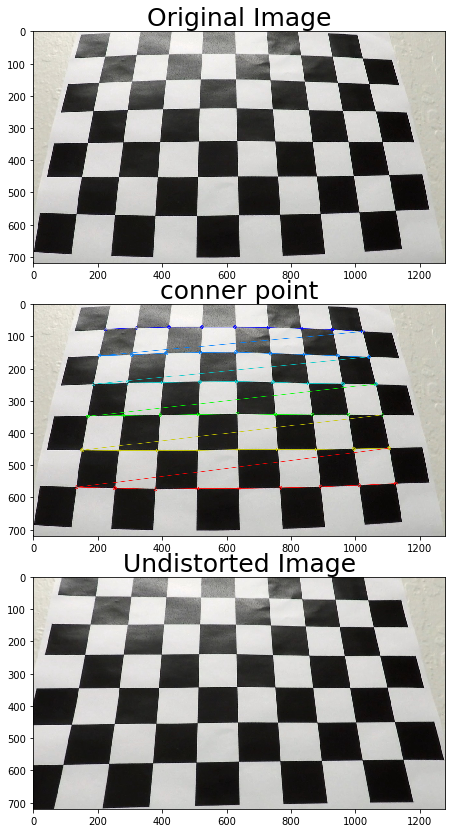

In [96]:
import numpy as np
from skimage import io
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import matplotlib.pyplot as plt
%matplotlib inline

ret00,images,objpoints,imgpoints= get_obj2img_points()

    
    
####################################################
#img_size = (img.shape[1], img.shape[0])
img_size=get_tuple_img_sizeYX()
ret01,mtx,dist=get_cal_undistort_param(img_size, objpoints, imgpoints)
####################################################


print(ret00)
print(ret01)

###################################################################################
import numpy as np
from skimage import io
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import matplotlib.pyplot as plt
%matplotlib inline

#print(images)
d=12
d=np.clip(d, 0, len(images))
print(images[d])
img= io.imread(images[d])   
#print(d)

# Draw and display the corners
c_img = img.copy()
c_img = cv2.drawChessboardCorners(c_img, (9,6),imgpoints[d], ret00)
undistorted = img.copy()
undistorted= cv2.undistort(undistorted, mtx, dist, None, mtx)


f, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(16, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(c_img)
ax2.set_title('conner point', fontsize=25)

ax3.imshow(undistorted)
ax3.set_title('Undistorted Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=1.2, bottom=0.)


src.shape (4, 2) s.shape (5, 2)


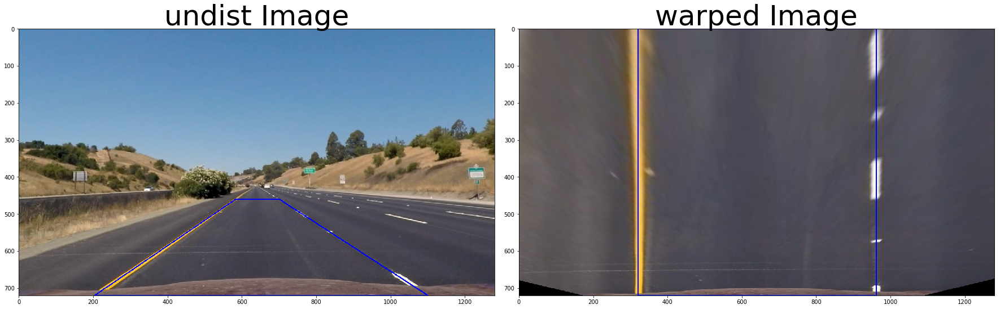

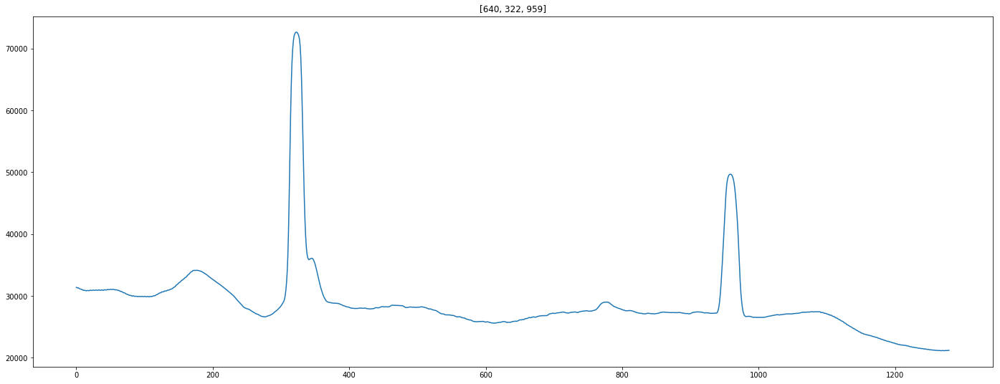

In [97]:
from skimage import io    
import glob
sight=glob.glob('./test_images/straight_lines*.jpg')
sight.sort()
img=io.imread(sight[0])
#img_size = (img.shape[1], img.shape[0])
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
M,src,dst=get_M_Matrix()
undist, warped=unwarp(img,mtx,dist,M)

disp=[undist.copy(),warped.copy()]
draw_lines_for_warp_operation(disp[0],disp[1],src,dst)


gray , edge, declr= customize_image_for_lane_excute(warped)

histogram, midpoint, leftx_base, rightx_base= get_warped_histogram_pack(warped)
plt.figure(figsize=(24, 9))
plt.plot(histogram)   
plt.title([midpoint, leftx_base, rightx_base])


./test_warps/warp1.jpg
./test_warps/warp2.jpg
./test_warps/warp3.jpg
./test_warps/warp4.jpg
./test_warps/warp5.jpg
./test_warps/warp6.jpg


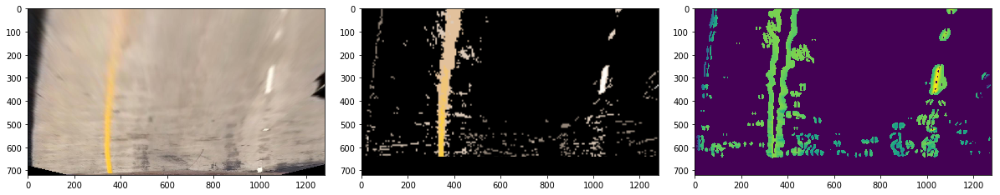

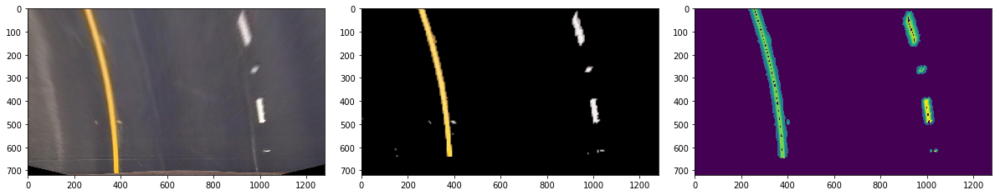

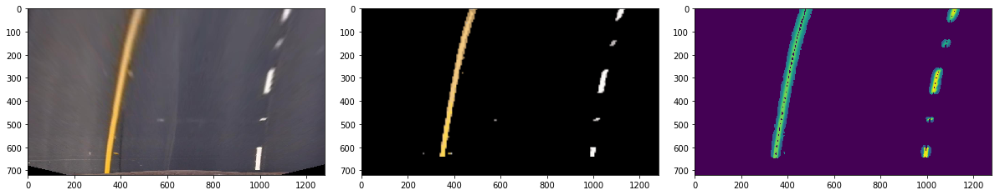

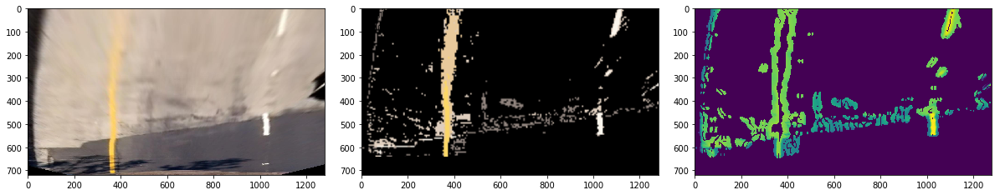

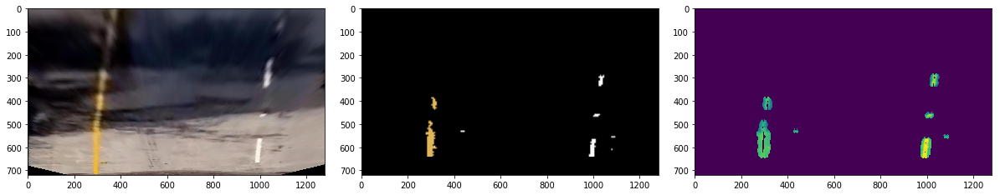

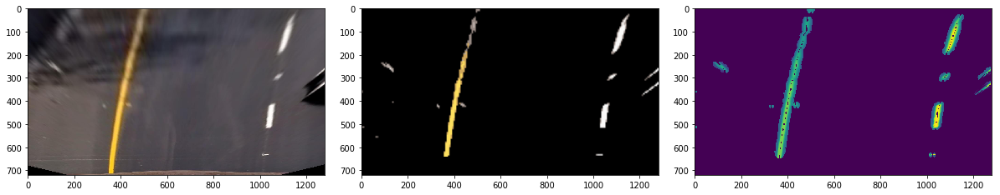

test


In [98]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline
import os.path


if os.path.exists('./test_warps/warp1.jpg')==False:
    sight=glob.glob('./test_images/test*.jpg')
    sight.sort()
    n=1
    for imfile in sight:
        img=io.imread(imfile)
        undist, warped=unwarp(img,mtx,dist,M)

        #text='./test_warps/warp%d.jpg'%(n,)
        text=imfile.replace('/test_images/test','/test_warps/warp')
        io.imsave(text,warped)
        n=n+1

sight=glob.glob('./test_warps/warp*.jpg')
sight.sort()
n=0
for src_warped in sight :
    print(src_warped)
    warped=io.imread(src_warped )
    
    gray , edge, declr= customize_image_for_lane_excute(warped)


    f, (ax1, ax2,ax3 ) = plt.subplots(1,3,figsize=(16, 6))
    f.tight_layout()
    ax1.imshow(warped)
    ax2.imshow(declr)
    ax3.imshow(gray)
    n=n+1  
    text='./test_warps/gray_warped%d.jpg'%(n,)
    
    io.imsave(text,gray)
        
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plt.show()     
print('test')

./test/000050.png
./test/000051.png
./test/000052.png
./test/000053.png
./test/000054.png


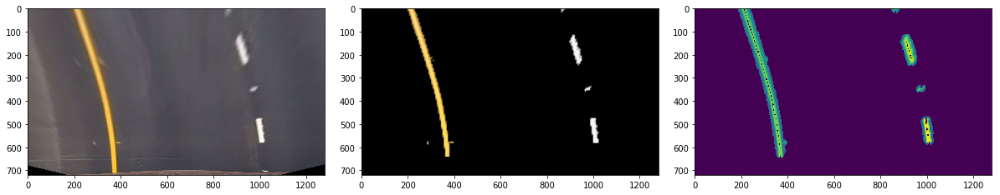

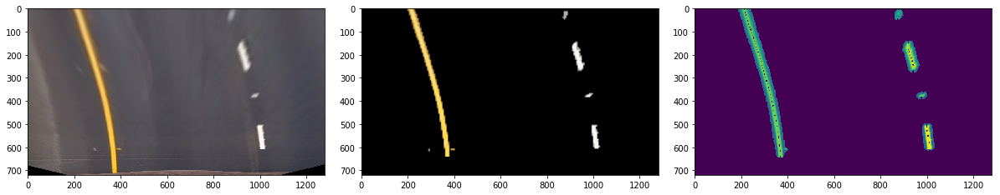

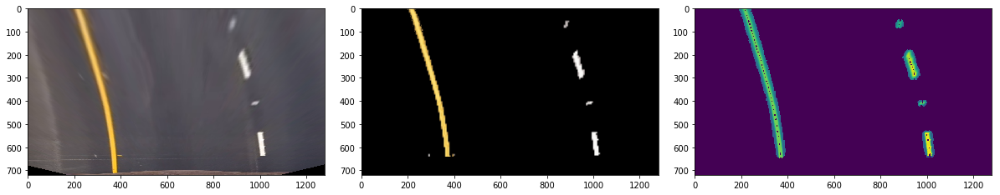

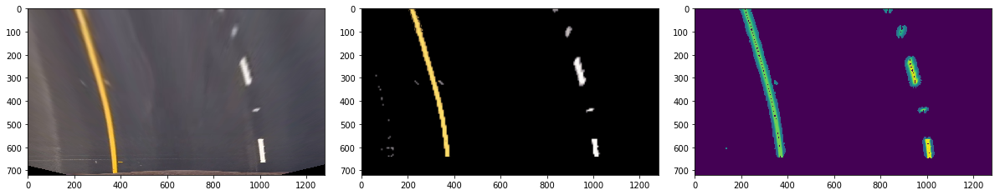

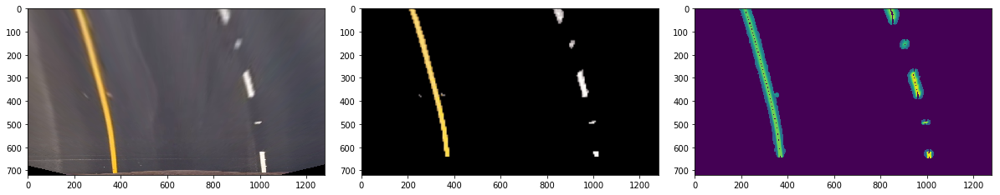

test


In [99]:

sight= glob.glob('./test/*.png')
sight.sort()
sight=sight[0:5]
n=0
for src_warped in sight :
    print(src_warped)
    img=io.imread(src_warped )
    undist, warped=unwarp(img,mtx,dist,M)
    
    gray , edge, declr= customize_image_for_lane_excute(warped)


    f, (ax1, ax2,ax3 ) = plt.subplots(1,3,figsize=(16, 6))
    f.tight_layout()
    ax1.imshow(warped)
    ax2.imshow(declr)
    ax3.imshow(gray)
    n=n+1  
        
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plt.show()     
print('test')

./test_warps/gray_warped1.jpg
(720, 1280, 3) 1 255
get_offset_of_centerline [720, 1280]
./test_warps/gray_warped2.jpg
(720, 1280, 3) 1 255
get_offset_of_centerline [720, 1280]
./test_warps/gray_warped3.jpg
(720, 1280, 3) 1 255
get_offset_of_centerline [720, 1280]
./test_warps/gray_warped4.jpg
(720, 1280, 3) 1 255
get_offset_of_centerline [720, 1280]
./test_warps/gray_warped5.jpg
(720, 1280, 3) 1 255
get_offset_of_centerline [720, 1280]
./test_warps/gray_warped6.jpg
(720, 1280, 3) 1 255
get_offset_of_centerline [720, 1280]


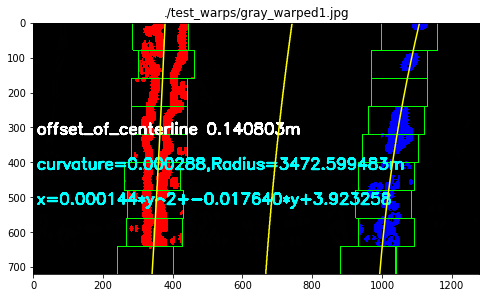

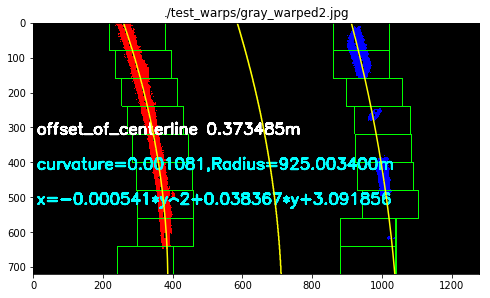

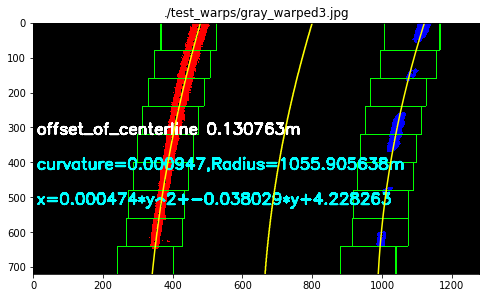

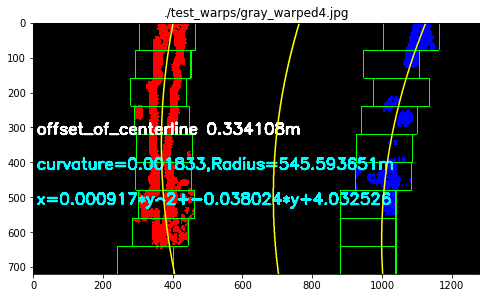

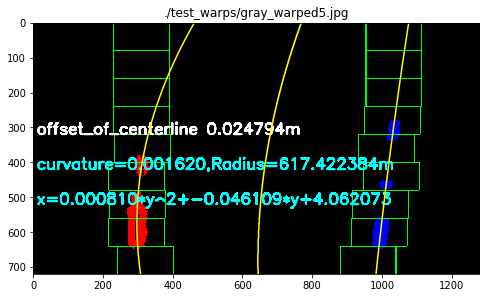

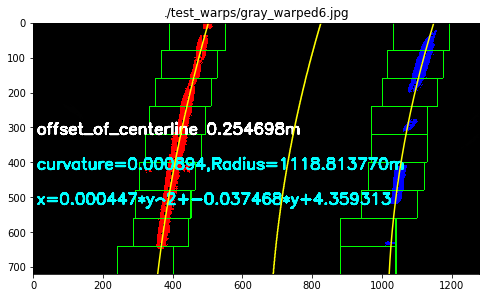

In [100]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

from skimage import io    
import glob
   
sight=glob.glob('./test_warps/gray_warped*.jpg')
sight.sort()

for src_warped in sight:
    print(src_warped)
    gray=io.imread(src_warped)
    
    thresh = 100
    max_pixel = 255
    ret02, binary_warped = cv2.threshold(gray,thresh,max_pixel,cv2.THRESH_BINARY)

    left_lane_inds,right_lane_inds,nonspace,rect=sliding_detect_function(binary_warped,9,80,leftx_base,rightx_base)

    nonzero=nonspace[0]
    nonzerox=nonspace[1]    
    nonzeroy=nonspace[2]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    print(out_img.shape,out_img.max(),binary_warped.max())
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    for l in rect[0]:
        cv2.rectangle(out_img,(l[0],l[1]),(l[2],l[3]),(0,255,0), 2) 
        
    for r in rect[1]:
        cv2.rectangle(out_img,(r[0],r[1]),(r[2],r[3]),(0,255,0), 2) 

        
    lfit,rfit,mfit,plotter,realfit=polynomial2ndfit(nonspace,left_lane_inds,right_lane_inds,leftx_base,rightx_base)
    text=get_str_poly_equation(realfit[2])
    
    font = cv2.FONT_ITALIC
    cv2.putText(out_img,text,(10,out_img.shape[0]-200) ,font, 1.5 ,(0,255,255),5,cv2.LINE_AA )
    
    
    R,curvature,text=   get_radius_of_curvature(yconv_warp2udist(out_img.shape[0]),realfit[2])
    cv2.putText(out_img,text,(10,out_img.shape[0]-300) ,font, 1.5 ,(0,255,255),5,cv2.LINE_AA )
    
    dx,rx,text=get_offset_of_centerline(mfit)
    cv2.putText(out_img,text,(10,out_img.shape[0]-400) ,font, 1.5 ,(255,255,255),5,cv2.LINE_AA )
    
    
    plt.figure(figsize=(8,6))
    plt.imshow(out_img)
    ploty=plotter[0]
    left_plotx=plotter[1]
    right_plotx=plotter[2]
    mid_plotx=plotter[3]
    
    plt.title(src_warped)
    plt.plot(right_plotx, ploty, color='yellow')
    plt.plot(left_plotx, ploty, color='yellow')
    plt.plot(mid_plotx, ploty, color='yellow')


    convL,convR,convM=convert_plotter_warp2undist(plotter[0],plotter[1],plotter[2],plotter[3])
    

In [101]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

from skimage import io    
import glob


last_binary_warped=[]
common_param=[]


def get_common_param():
    ret00,images,objpoints,imgpoints= get_obj2img_points()
    ret01,mtx,dist=get_cal_undistort_param(get_tuple_img_sizeYX(), objpoints, imgpoints)
    M,src,dst=get_M_Matrix()

    return  [M,mtx,dist]


####################################################

def make_resume_mask(tgt,ploty,left_fitx,right_fitx,margin):

    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))

    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    mask=tgt.copy()
    mask=mask*0
    cv2.fillPoly(mask, np.int_([left_line_pts]), 1)
    cv2.fillPoly(mask, np.int_([right_line_pts]),1)
    
    #plt.figure()
    #plt.imshow(mask)
    #plt.show()
    
    return mask
    
    
resetcounter=0    
def ans_project_move_function(img,lastx_base,debug):
    global last_binary_warped
    global common_param
    global resetcounter
    
    if len(common_param)==0:
        common_param=get_common_param()
       
    M=common_param[0]
    src=common_param[1]
    dist=common_param[2]
       
       
    undist, warped=unwarp(img,mtx,dist,M)
    gray , edge, declr= customize_image_for_lane_excute(warped)
 
    #histogram, midpoint, leftx_base, rightx_base= get_warped_histogram_pack(warped)
    histogram, midpoint, leftx_base, rightx_base= get_warped_histogram_pack(gray)
    """
    plt.figure()
    plt.plot(histogram)   
    plt.title([midpoint, leftx_base, rightx_base])
    """
    
    if len(lastx_base)==2 :
        xlast_l_base=lastx_base[0]
        xlast_r_base=lastx_base[1]
        if(xlast_l_base>0):
             leftx_base=(leftx_base+xlast_l_base)//2   
        if(xlast_r_base>0):
             rightx_base=(rightx_base+xlast_r_base)//2   
    
    thresh = 100
    max_pixel = 255
    ret02, binary_warped_now = cv2.threshold(gray,thresh,max_pixel,cv2.THRESH_BINARY)

    binary_warped=binary_warped_now.copy()
    if(len(last_binary_warped)==0):
        last_binary_warped=np.array([binary_warped_now.copy(),binary_warped_now.copy()])
        
    binary_warped=cv2.bitwise_or(binary_warped,last_binary_warped[1])
    binary_warped=cv2.bitwise_or(binary_warped,last_binary_warped[0])
    
    H=binary_warped.shape[0]
    W=binary_warped.shape[1]
    h=0
    check1=-1
    check2=-1
    check3=-1
    check4=-1
    
    data= binary_warped.copy()
    while 1:
        data= binary_warped.copy()
        data[0:h,:]*=0
        
        left_lane_inds,right_lane_inds,nonspace,rect=sliding_detect_function(data,9,80,leftx_base,rightx_base)
        lfit,rfit,mfit,plotter,realfit=polynomial2ndfit(nonspace,left_lane_inds,right_lane_inds,leftx_base,rightx_base)
         
        dxL=[lfit[1],1] 
        dxR=[rfit[1],1]
        check1=(abs(angle(dxL,dxR))<5)
        
        dxL=[2*lfit[0]*H+lfit[1],1] 
        dxR=[2*rfit[0]*H+rfit[1],1]
        check2=(abs(angle(dxL,dxR))<5)
                
        L=lfit[0]*H*H+lfit[1]*H+lfit[2]
        R=rfit[0]*H*H+rfit[1]*H+rfit[2]
        check3=abs(abs(R-L)-W//2)<15
        
        M=mfit[0]*H*H+mfit[1]*H+mfit[2]
        check4=abs(M-W//2)<80
        
        
        lpbreak=(check1&check2&check3&check4)
        ovbreak=(  h>=(H//2)  )
        if(lpbreak|ovbreak) :   
            if(ovbreak):
                if(len(last_binary_warped)>0):
                    data=last_binary_warped[0]
            else:
                mask=make_resume_mask(data,plotter[0],plotter[1],plotter[2],25)
                data=data*mask
                        
            left_lane_inds,right_lane_inds,nonspace,rect=sliding_detect_function(data,9,80,leftx_base,rightx_base)
            lfit,rfit,mfit,plotter,realfit=polynomial2ndfit(nonspace,left_lane_inds,right_lane_inds,leftx_base,rightx_base)
            if(lpbreak):
                last_binary_warped[1]=last_binary_warped[0].copy()
                last_binary_warped[0]=data.copy()
                resetcounter=0
            else:             
                if(resetcounter>2):
                    last_binary_warped=[]            
                    resetcounter=0
                
            break
            
        h=h+H//10
    
    #if debug==True:
    #     print(check1,check2,check3)        
            
            
    mfit ,plotter[0], plotter[1], plotter[2], plotter[3] =get_mid_fitting(lfit,rfit) 
    convL,convR,convM=convert_plotter_warp2undist(plotter[0],plotter[1],plotter[2],plotter[3])
     
    
    result= fill_current_lane(img,convL,convR)

    
    font = cv2.FONT_ITALIC
    
    R,curvature,text=   get_radius_of_curvature(yconv_warp2udist(result.shape[0]),realfit[2])
    cv2.putText(result,text,(10,100) ,font, 1.5 ,(0,255,255),5,cv2.LINE_AA )
    
    dx,rx,text=get_offset_of_centerline(mfit)
    cv2.putText(result,text,(10,150) ,font, 1.5 ,(255,255,255),5,cv2.LINE_AA )


    
    ########
    if debug==True:
        data=cv2.cvtColor(data,cv2.COLOR_GRAY2BGR)    
        y=np.array(plotter[0],int)
        l=np.array(plotter[1],int)
        r=np.array(plotter[2],int)
        for p in range(len(y)-1):
            cv2.line(data,(l[p],y[p]),(l[p+1],y[p+1]),(255,0,0),5)
            cv2.line(data,(r[p],y[p]),(r[p+1],y[p+1]),(0,0,255),5)
        img=cv2.hconcat([result,data])
        result=cv2.resize(img,(img.shape[1]//2,img.shape[0]))
        
    return result,[leftx_base,rightx_base],[lfit,rfit,mfit]
    

fault ./camera_cal/calibration1.jpg
fault ./camera_cal/calibration4.jpg
fault ./camera_cal/calibration5.jpg
get_offset_of_centerline [720, 1280]


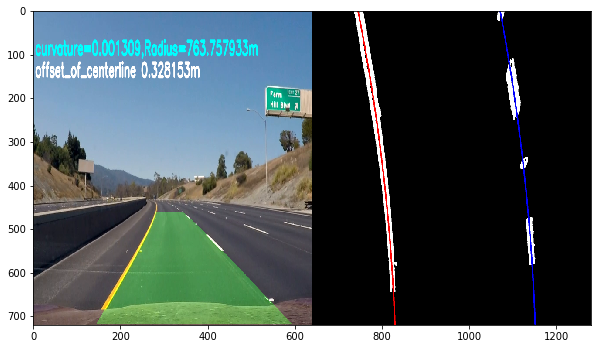

get_offset_of_centerline [720, 1280]


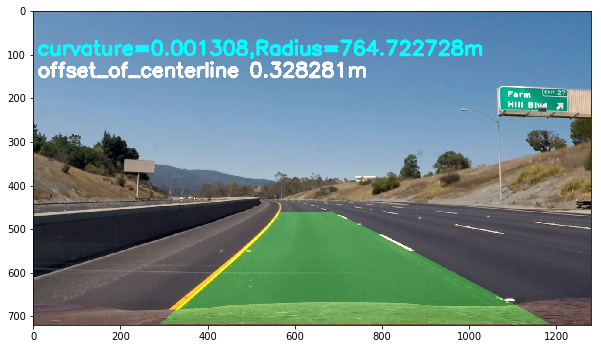

get_offset_of_centerline [720, 1280]


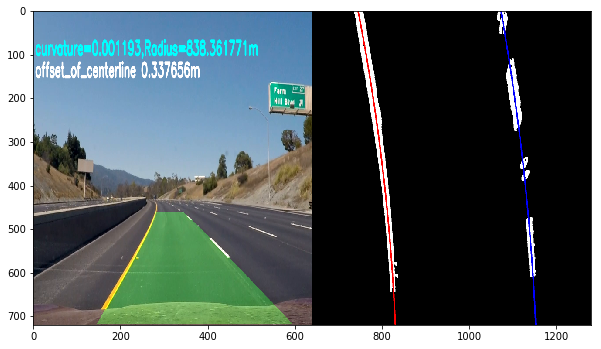

get_offset_of_centerline [720, 1280]


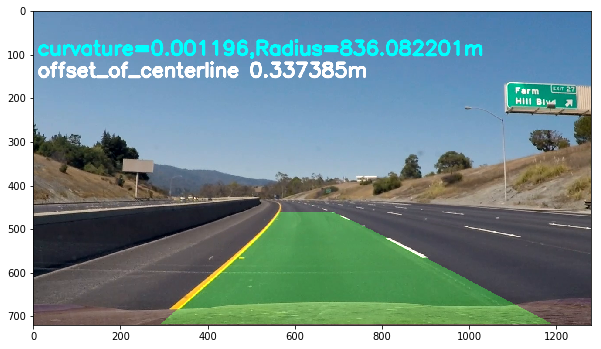

get_offset_of_centerline [720, 1280]


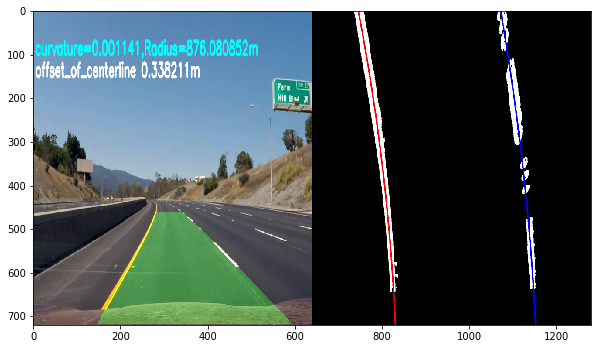

get_offset_of_centerline [720, 1280]


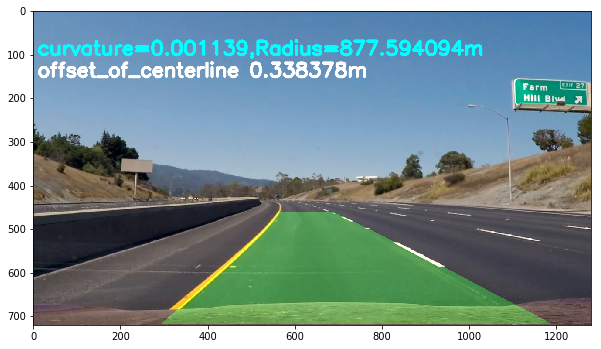

get_offset_of_centerline [720, 1280]


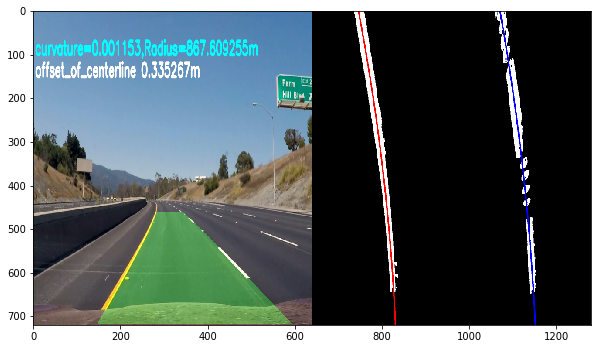

get_offset_of_centerline [720, 1280]


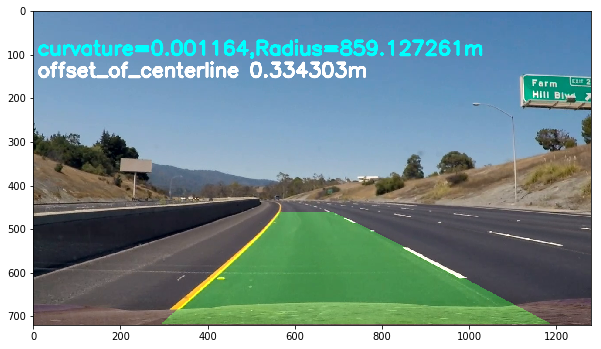

get_offset_of_centerline [720, 1280]


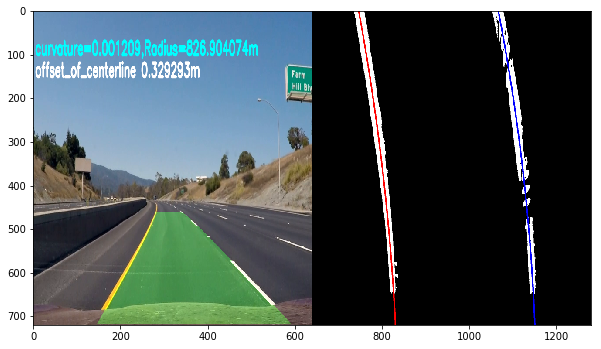

get_offset_of_centerline [720, 1280]


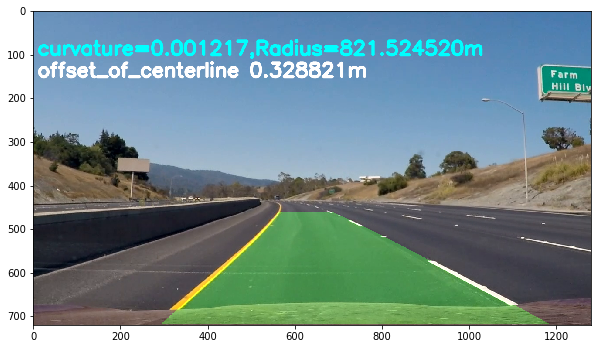

get_offset_of_centerline [720, 1280]


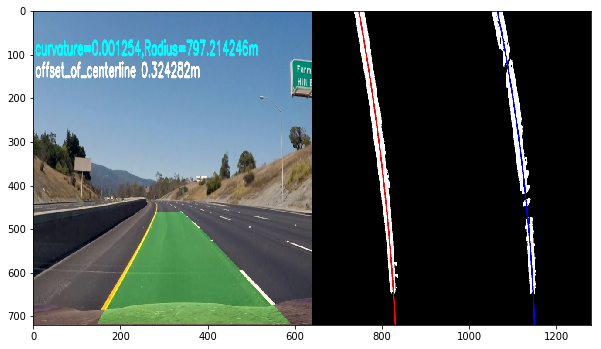

get_offset_of_centerline [720, 1280]


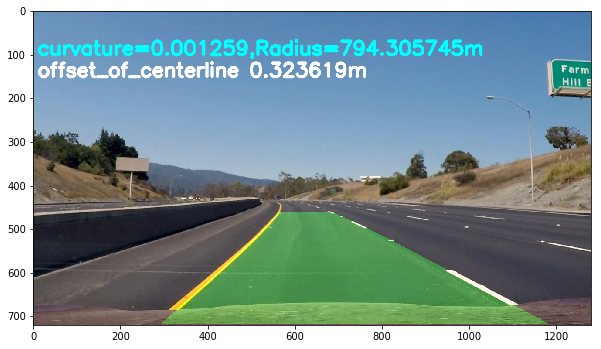

get_offset_of_centerline [720, 1280]


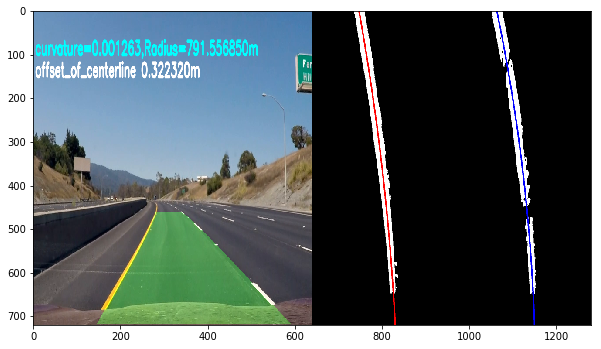

get_offset_of_centerline [720, 1280]


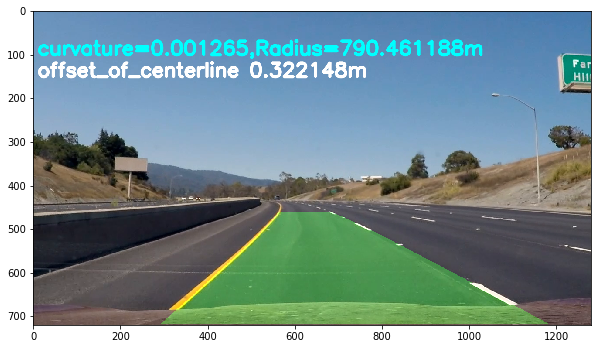

get_offset_of_centerline [720, 1280]


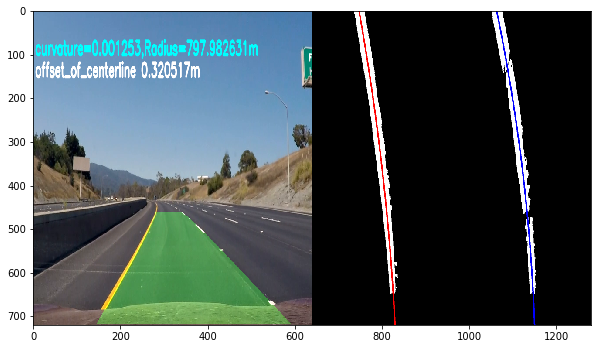

get_offset_of_centerline [720, 1280]


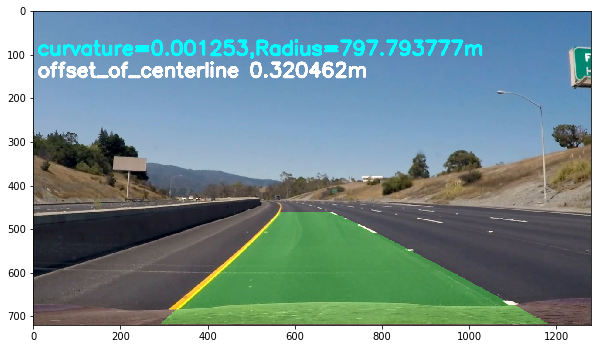

get_offset_of_centerline [720, 1280]


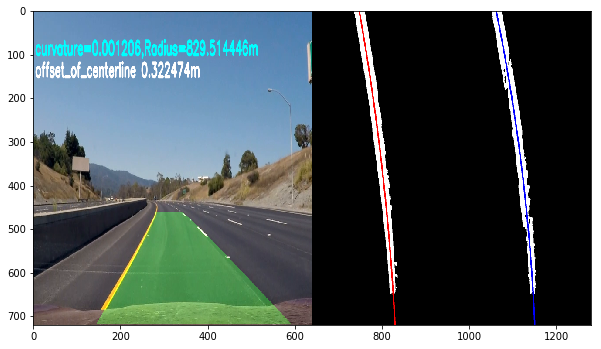

get_offset_of_centerline [720, 1280]


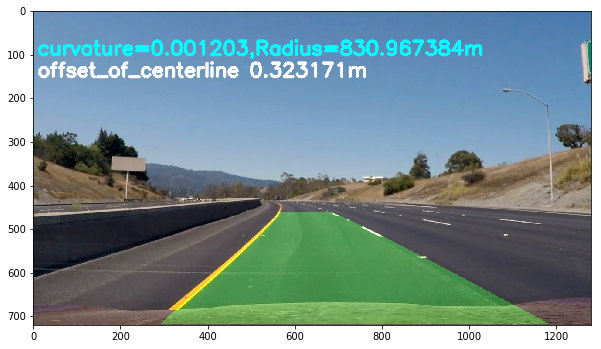

get_offset_of_centerline [720, 1280]


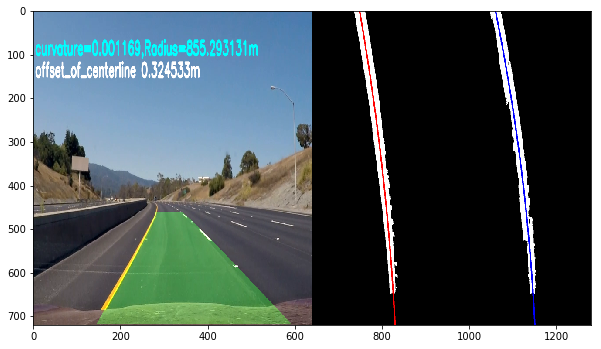

get_offset_of_centerline [720, 1280]


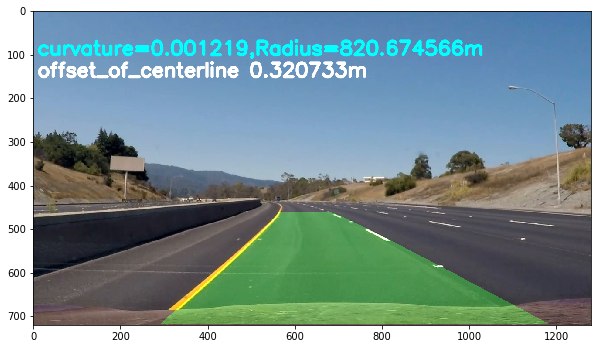

get_offset_of_centerline [720, 1280]


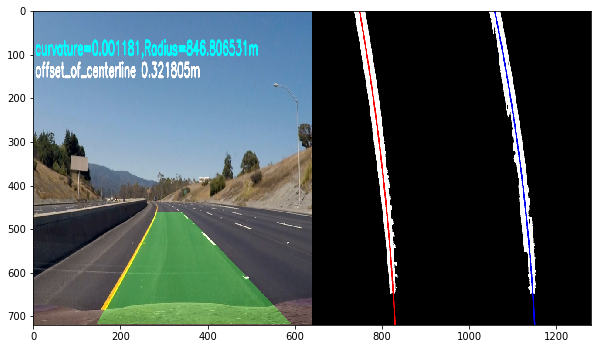

get_offset_of_centerline [720, 1280]


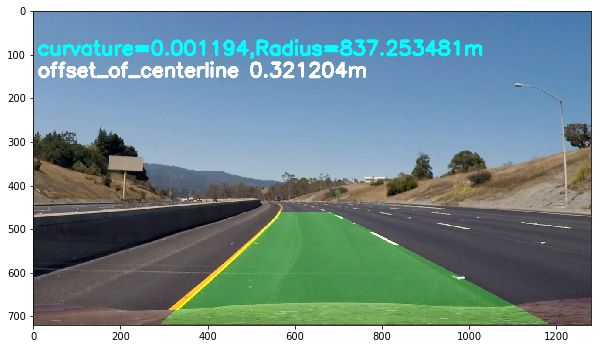

get_offset_of_centerline [720, 1280]


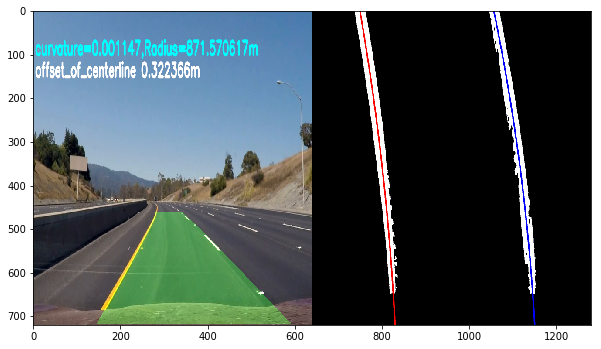

get_offset_of_centerline [720, 1280]


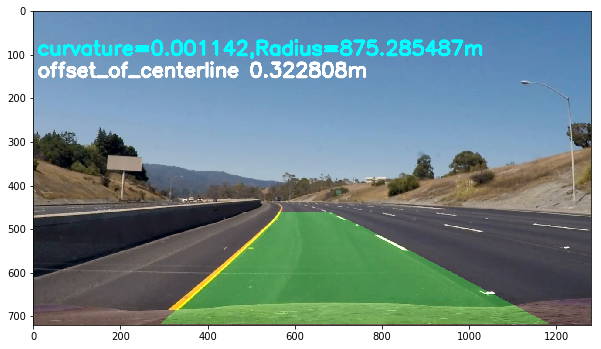

get_offset_of_centerline [720, 1280]


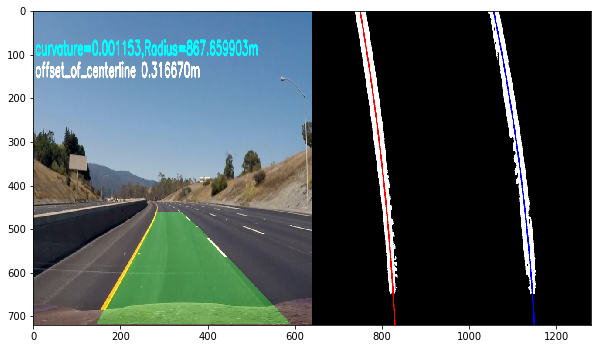

get_offset_of_centerline [720, 1280]


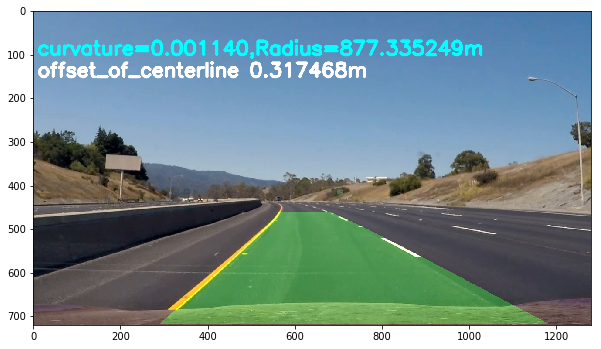

get_offset_of_centerline [720, 1280]


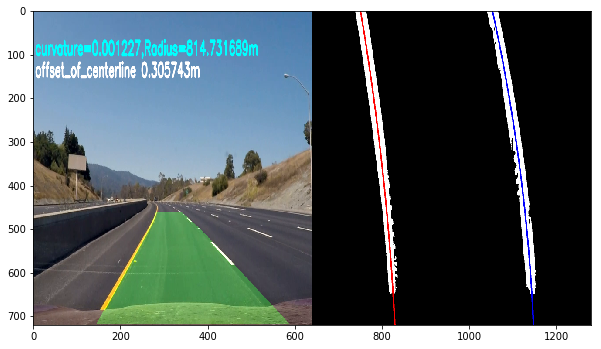

get_offset_of_centerline [720, 1280]


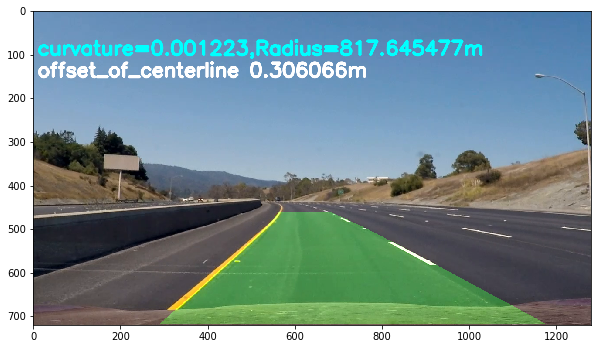

get_offset_of_centerline [720, 1280]


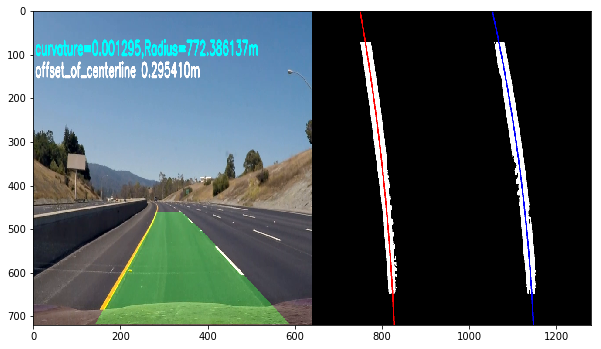

get_offset_of_centerline [720, 1280]


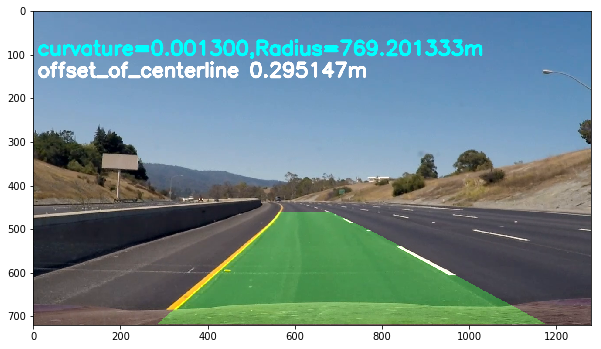

get_offset_of_centerline [720, 1280]


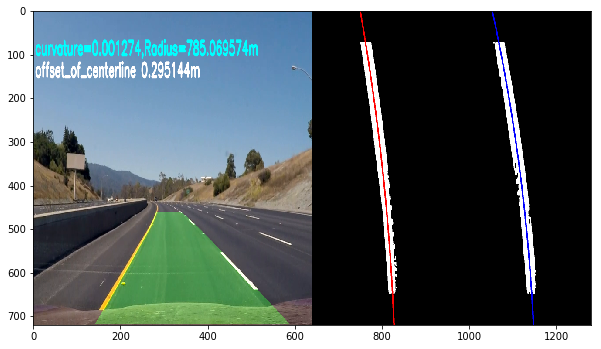

get_offset_of_centerline [720, 1280]


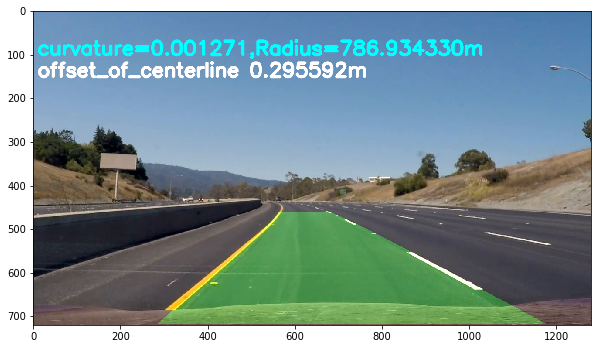

get_offset_of_centerline [720, 1280]


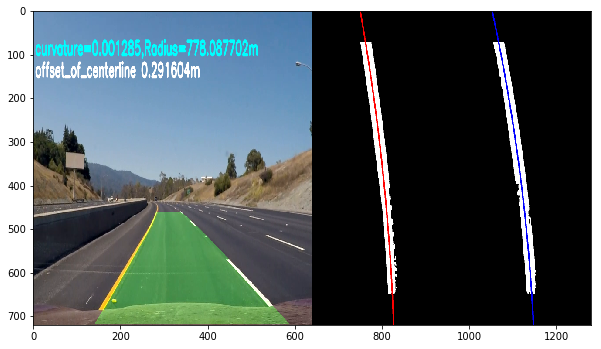

get_offset_of_centerline [720, 1280]


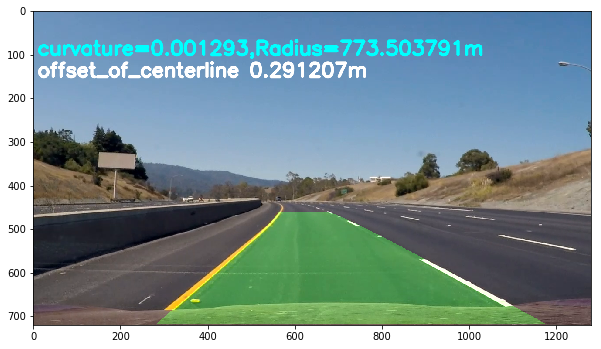

get_offset_of_centerline [720, 1280]


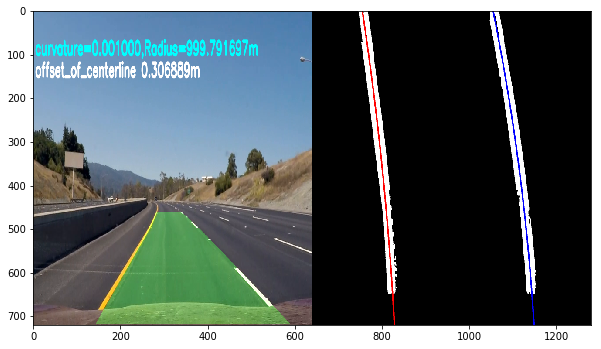

get_offset_of_centerline [720, 1280]


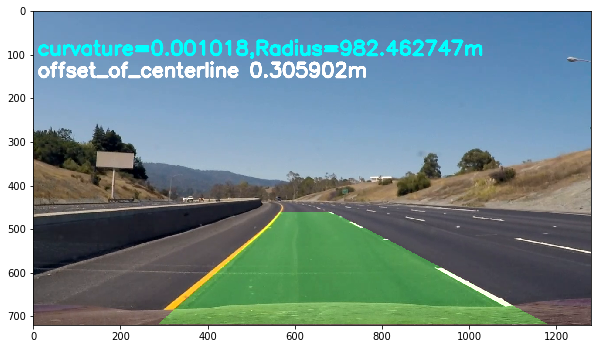

get_offset_of_centerline [720, 1280]


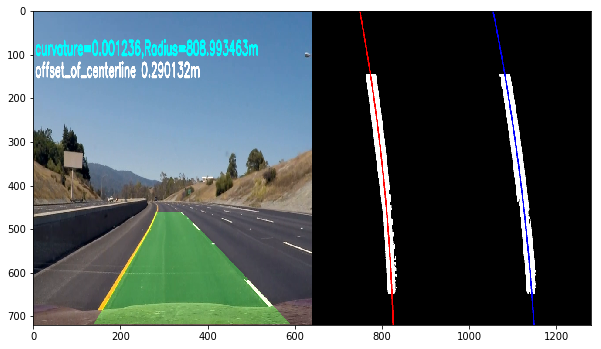

get_offset_of_centerline [720, 1280]


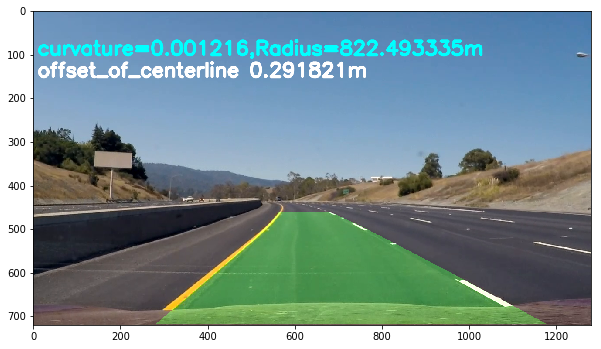

get_offset_of_centerline [720, 1280]


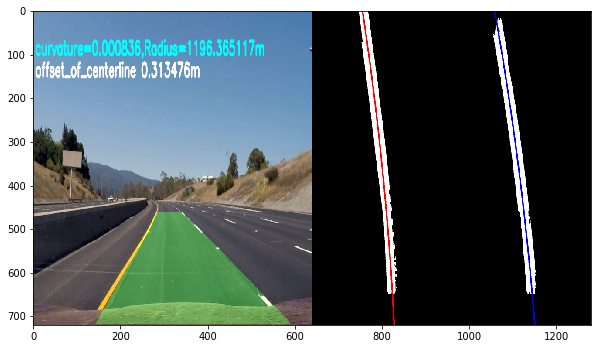

get_offset_of_centerline [720, 1280]


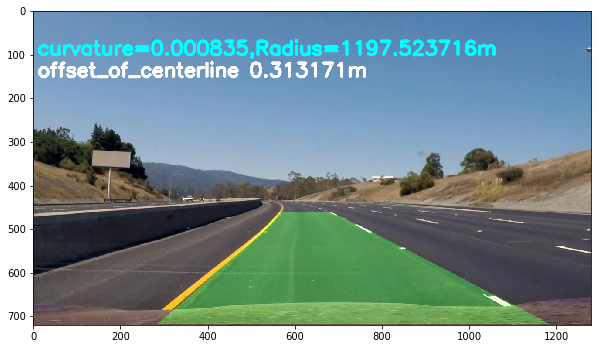

get_offset_of_centerline [720, 1280]


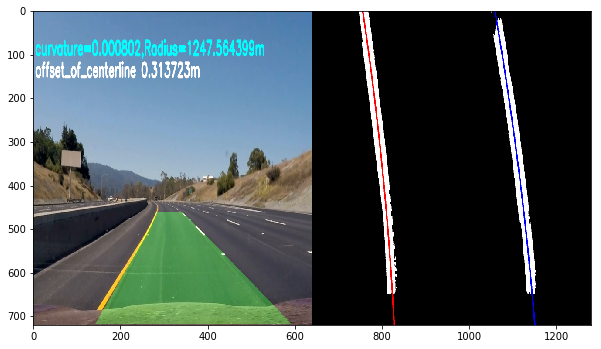

get_offset_of_centerline [720, 1280]


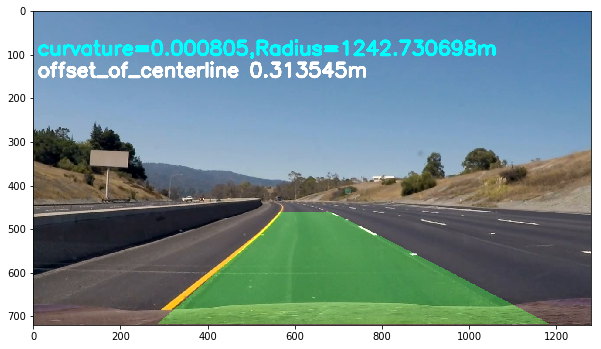

get_offset_of_centerline [720, 1280]


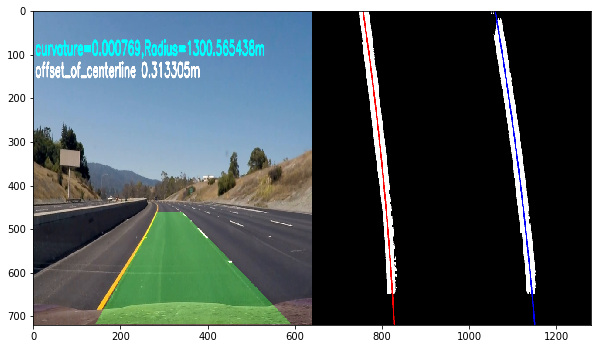

get_offset_of_centerline [720, 1280]


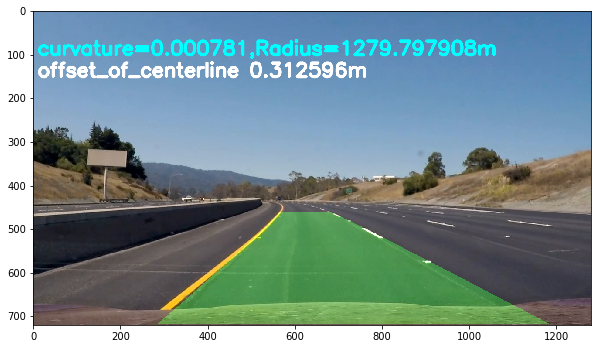

get_offset_of_centerline [720, 1280]


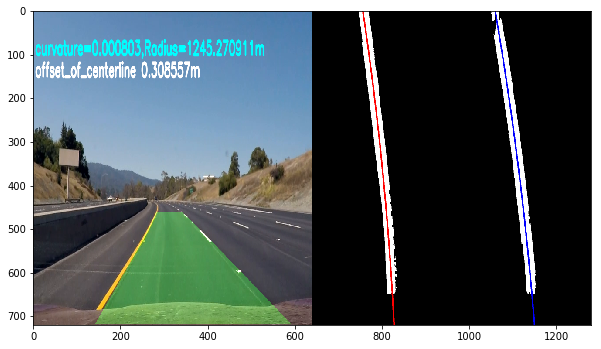

get_offset_of_centerline [720, 1280]


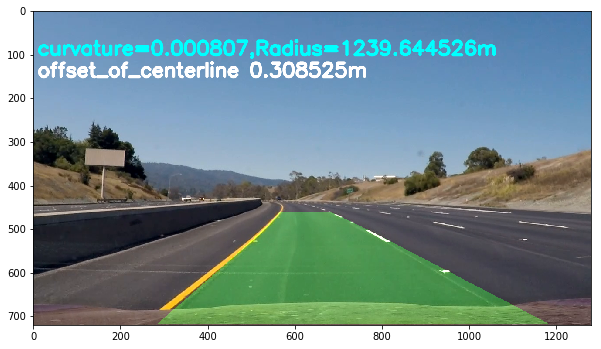

In [102]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

#ffmpeg -i project_video.mp4  -ss 19 -t 26 -r 24 -f ./pickupsight/test/SRC/image%06d.png
target='./test_images/test1.jpg'
#target='./pickupsight/test/SRC/image000120.png'

lastx_base=[-1,-1]
sight=glob.glob('./test/*.png')
sight.sort()

#sight=sight[0:4]
for target in sight:
    
    img=io.imread(target)
    result,lastx_base,last_fit=ans_project_move_function(img,lastx_base,True)

    plt.figure(figsize=(10,6))
    plt.imshow(result)
    plt.show()
    
    img=io.imread(target)
    result,lastx_base,last_fit=ans_project_move_function(img,lastx_base,False)

    plt.figure(figsize=(10,6))
    plt.imshow(result)
    plt.show()

In [104]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import cv2
import matplotlib.pyplot as plt


lastx_base=[-1,-1]

import datetime
def process_image(image):
    global base_time    
    global lastx_base
    global last_fit
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    # TODO: Build your pipeline that will draw lane lines on the test_images
    # then save them to the test_images directory.

    # TODO: Build your pipeline that will draw lane lines on the test_images
    # then save them to the test_images directory.

    
    
    result,lastx_base,last_fit=ans_project_move_function(image,lastx_base,False)
    #result,lastx_base,last_fit=ans_project_move_function(image,lastx_base,True)


    now = datetime.datetime.now()
    font = cv2.FONT_ITALIC
    result =cv2.putText(result,str(now),(10,50) ,font, 1.5 ,(255,255,0),5,cv2.LINE_AA )
    
    #plt.figure(figsize=(10,6))
    #plt.imshow(result)
    #plt.show()
    return result 



In [105]:
prj_output = 'videos_output/project_ans03.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

#clip1  = VideoFileClip("./project_video.mp4").subclip(0,5)
clip1  = VideoFileClip("./project_video.mp4")


#white_clip  =  clip1.fl_image(test_image) #NOTE: this function expects color images!!
white_clip  =  clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(prj_output, audio=False)



get_offset_of_centerline [720, 1280]
[MoviePy] >>>> Building video videos_output/project_ans03.mp4
[MoviePy] Writing video videos_output/project_ans03.mp4


  0%|          | 1/1261 [00:01<22:22,  1.07s/it]

get_offset_of_centerline [720, 1280]


  0%|          | 2/1261 [00:02<22:19,  1.06s/it]

get_offset_of_centerline [720, 1280]


  0%|          | 3/1261 [00:03<22:11,  1.06s/it]

get_offset_of_centerline [720, 1280]


  0%|          | 4/1261 [00:04<22:09,  1.06s/it]

get_offset_of_centerline [720, 1280]


  0%|          | 5/1261 [00:05<22:28,  1.07s/it]

get_offset_of_centerline [720, 1280]


  0%|          | 6/1261 [00:06<22:15,  1.06s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 7/1261 [00:07<22:29,  1.08s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 8/1261 [00:08<22:21,  1.07s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 9/1261 [00:09<22:22,  1.07s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 10/1261 [00:10<22:22,  1.07s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 11/1261 [00:11<22:21,  1.07s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 12/1261 [00:12<22:47,  1.09s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 13/1261 [00:14<23:11,  1.11s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 14/1261 [00:15<23:32,  1.13s/it]

get_offset_of_centerline [720, 1280]


  1%|          | 15/1261 [00:16<23:01,  1.11s/it]

get_offset_of_centerline [720, 1280]


  1%|▏         | 16/1261 [00:17<22:41,  1.09s/it]

get_offset_of_centerline [720, 1280]


  1%|▏         | 17/1261 [00:18<22:19,  1.08s/it]

get_offset_of_centerline [720, 1280]


  1%|▏         | 18/1261 [00:19<22:00,  1.06s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 19/1261 [00:20<21:52,  1.06s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 20/1261 [00:21<21:51,  1.06s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 21/1261 [00:22<21:46,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 22/1261 [00:23<21:52,  1.06s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 23/1261 [00:24<21:48,  1.06s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 24/1261 [00:25<21:47,  1.06s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 25/1261 [00:26<21:39,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 26/1261 [00:27<21:35,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 27/1261 [00:28<21:37,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 28/1261 [00:29<21:36,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 29/1261 [00:30<21:34,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 30/1261 [00:32<21:33,  1.05s/it]

get_offset_of_centerline [720, 1280]


  2%|▏         | 31/1261 [00:33<21:27,  1.05s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 32/1261 [00:34<21:21,  1.04s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 33/1261 [00:35<21:09,  1.03s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 34/1261 [00:36<22:52,  1.12s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 35/1261 [00:37<22:54,  1.12s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 36/1261 [00:38<22:29,  1.10s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 37/1261 [00:39<22:39,  1.11s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 38/1261 [00:40<22:47,  1.12s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 39/1261 [00:42<24:00,  1.18s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 40/1261 [00:43<23:47,  1.17s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 41/1261 [00:44<25:29,  1.25s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 42/1261 [00:46<29:46,  1.47s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 43/1261 [00:48<30:04,  1.48s/it]

get_offset_of_centerline [720, 1280]


  3%|▎         | 44/1261 [00:49<27:27,  1.35s/it]

get_offset_of_centerline [720, 1280]


  4%|▎         | 45/1261 [00:50<25:35,  1.26s/it]

get_offset_of_centerline [720, 1280]


  4%|▎         | 46/1261 [00:51<24:19,  1.20s/it]

get_offset_of_centerline [720, 1280]


  4%|▎         | 47/1261 [00:52<23:47,  1.18s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 48/1261 [00:53<23:20,  1.15s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 49/1261 [00:54<23:14,  1.15s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 50/1261 [00:55<23:15,  1.15s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 51/1261 [00:57<23:00,  1.14s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 52/1261 [00:58<23:40,  1.18s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 53/1261 [00:59<23:37,  1.17s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 54/1261 [01:00<23:26,  1.17s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 55/1261 [01:01<23:47,  1.18s/it]

get_offset_of_centerline [720, 1280]


  4%|▍         | 56/1261 [01:03<23:53,  1.19s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 57/1261 [01:04<23:36,  1.18s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 58/1261 [01:05<23:10,  1.16s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 59/1261 [01:06<23:08,  1.15s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 60/1261 [01:07<23:13,  1.16s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 61/1261 [01:08<23:03,  1.15s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 62/1261 [01:09<22:53,  1.15s/it]

get_offset_of_centerline [720, 1280]


  5%|▍         | 63/1261 [01:11<22:53,  1.15s/it]

get_offset_of_centerline [720, 1280]


  5%|▌         | 64/1261 [01:12<23:17,  1.17s/it]

get_offset_of_centerline [720, 1280]


  5%|▌         | 65/1261 [01:13<23:12,  1.16s/it]

get_offset_of_centerline [720, 1280]


  5%|▌         | 66/1261 [01:14<22:55,  1.15s/it]

get_offset_of_centerline [720, 1280]


  5%|▌         | 67/1261 [01:15<22:52,  1.15s/it]

get_offset_of_centerline [720, 1280]


  5%|▌         | 68/1261 [01:16<23:13,  1.17s/it]

get_offset_of_centerline [720, 1280]


  5%|▌         | 69/1261 [01:18<23:25,  1.18s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 70/1261 [01:19<23:01,  1.16s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 71/1261 [01:20<22:45,  1.15s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 72/1261 [01:21<23:05,  1.17s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 73/1261 [01:22<22:59,  1.16s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 74/1261 [01:23<22:40,  1.15s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 75/1261 [01:24<22:25,  1.13s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 76/1261 [01:26<22:44,  1.15s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 77/1261 [01:27<22:55,  1.16s/it]

get_offset_of_centerline [720, 1280]


  6%|▌         | 78/1261 [01:28<22:55,  1.16s/it]

get_offset_of_centerline [720, 1280]


  6%|▋         | 79/1261 [01:29<22:39,  1.15s/it]

get_offset_of_centerline [720, 1280]


  6%|▋         | 80/1261 [01:30<23:01,  1.17s/it]

get_offset_of_centerline [720, 1280]


  6%|▋         | 81/1261 [01:31<22:57,  1.17s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 82/1261 [01:33<22:18,  1.14s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 83/1261 [01:34<22:20,  1.14s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 84/1261 [01:35<23:10,  1.18s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 85/1261 [01:36<23:33,  1.20s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 86/1261 [01:37<23:55,  1.22s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 87/1261 [01:39<23:51,  1.22s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 88/1261 [01:41<32:26,  1.66s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 89/1261 [01:43<31:52,  1.63s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 90/1261 [01:44<30:22,  1.56s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 91/1261 [01:46<28:36,  1.47s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 92/1261 [01:47<27:58,  1.44s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 93/1261 [01:48<27:16,  1.40s/it]

get_offset_of_centerline [720, 1280]


  7%|▋         | 94/1261 [01:50<26:24,  1.36s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 95/1261 [01:51<26:07,  1.34s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 96/1261 [01:52<26:01,  1.34s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 97/1261 [01:53<25:45,  1.33s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 98/1261 [01:55<25:20,  1.31s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 99/1261 [01:56<24:53,  1.28s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 100/1261 [01:57<24:56,  1.29s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 101/1261 [01:59<25:08,  1.30s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 102/1261 [02:00<24:50,  1.29s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 103/1261 [02:01<24:52,  1.29s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 104/1261 [02:02<25:13,  1.31s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 105/1261 [02:04<25:09,  1.31s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 106/1261 [02:05<24:45,  1.29s/it]

get_offset_of_centerline [720, 1280]


  8%|▊         | 107/1261 [02:06<24:50,  1.29s/it]

get_offset_of_centerline [720, 1280]


  9%|▊         | 108/1261 [02:08<25:02,  1.30s/it]

get_offset_of_centerline [720, 1280]


  9%|▊         | 109/1261 [02:09<25:14,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▊         | 110/1261 [02:10<25:06,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 111/1261 [02:12<24:43,  1.29s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 112/1261 [02:13<25:00,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 113/1261 [02:14<25:08,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 114/1261 [02:16<25:04,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 115/1261 [02:17<24:59,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 116/1261 [02:18<25:08,  1.32s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 117/1261 [02:20<25:10,  1.32s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 118/1261 [02:21<24:57,  1.31s/it]

get_offset_of_centerline [720, 1280]


  9%|▉         | 119/1261 [02:22<24:41,  1.30s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 120/1261 [02:23<24:41,  1.30s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 121/1261 [02:25<24:44,  1.30s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 122/1261 [02:26<24:31,  1.29s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 123/1261 [02:27<24:32,  1.29s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 124/1261 [02:29<25:03,  1.32s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 125/1261 [02:30<24:58,  1.32s/it]

get_offset_of_centerline [720, 1280]


 10%|▉         | 126/1261 [02:31<24:40,  1.30s/it]

get_offset_of_centerline [720, 1280]


 10%|█         | 127/1261 [02:32<24:27,  1.29s/it]

get_offset_of_centerline [720, 1280]


 10%|█         | 128/1261 [02:34<24:00,  1.27s/it]

get_offset_of_centerline [720, 1280]


 10%|█         | 129/1261 [02:35<24:30,  1.30s/it]

get_offset_of_centerline [720, 1280]


 10%|█         | 130/1261 [02:36<24:37,  1.31s/it]

get_offset_of_centerline [720, 1280]


 10%|█         | 131/1261 [02:38<24:39,  1.31s/it]

get_offset_of_centerline [720, 1280]


 10%|█         | 132/1261 [02:40<28:22,  1.51s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 133/1261 [02:42<31:39,  1.68s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 134/1261 [02:44<35:02,  1.87s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 135/1261 [02:46<33:06,  1.76s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 136/1261 [02:47<30:44,  1.64s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 137/1261 [02:48<28:57,  1.55s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 138/1261 [02:49<27:01,  1.44s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 139/1261 [02:51<25:19,  1.35s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 140/1261 [02:52<24:43,  1.32s/it]

get_offset_of_centerline [720, 1280]


 11%|█         | 141/1261 [02:53<23:53,  1.28s/it]

get_offset_of_centerline [720, 1280]


 11%|█▏        | 142/1261 [02:54<23:13,  1.25s/it]

get_offset_of_centerline [720, 1280]


 11%|█▏        | 143/1261 [02:55<23:08,  1.24s/it]

get_offset_of_centerline [720, 1280]


 11%|█▏        | 144/1261 [02:57<23:17,  1.25s/it]

get_offset_of_centerline [720, 1280]


 11%|█▏        | 145/1261 [02:58<23:19,  1.25s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 146/1261 [02:59<23:09,  1.25s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 147/1261 [03:00<22:49,  1.23s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 148/1261 [03:02<22:52,  1.23s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 149/1261 [03:03<22:54,  1.24s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 150/1261 [03:04<22:22,  1.21s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 151/1261 [03:05<22:13,  1.20s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 152/1261 [03:06<22:22,  1.21s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 153/1261 [03:08<22:22,  1.21s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 154/1261 [03:09<21:51,  1.18s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 155/1261 [03:10<21:34,  1.17s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 156/1261 [03:11<21:37,  1.17s/it]

get_offset_of_centerline [720, 1280]


 12%|█▏        | 157/1261 [03:12<21:39,  1.18s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 158/1261 [03:13<21:23,  1.16s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 159/1261 [03:15<21:09,  1.15s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 160/1261 [03:16<21:41,  1.18s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 161/1261 [03:17<21:39,  1.18s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 162/1261 [03:18<21:29,  1.17s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 163/1261 [03:19<21:20,  1.17s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 164/1261 [03:20<21:37,  1.18s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 165/1261 [03:22<21:42,  1.19s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 166/1261 [03:23<21:42,  1.19s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 167/1261 [03:24<21:25,  1.18s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 168/1261 [03:25<21:36,  1.19s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 169/1261 [03:26<21:37,  1.19s/it]

get_offset_of_centerline [720, 1280]


 13%|█▎        | 170/1261 [03:28<21:23,  1.18s/it]

get_offset_of_centerline [720, 1280]


 14%|█▎        | 171/1261 [03:29<21:22,  1.18s/it]

get_offset_of_centerline [720, 1280]


 14%|█▎        | 172/1261 [03:30<21:33,  1.19s/it]

get_offset_of_centerline [720, 1280]


 14%|█▎        | 173/1261 [03:31<21:32,  1.19s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 174/1261 [03:32<21:20,  1.18s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 175/1261 [03:33<21:11,  1.17s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 176/1261 [03:35<21:20,  1.18s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 177/1261 [03:36<21:15,  1.18s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 178/1261 [03:37<21:02,  1.17s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 179/1261 [03:38<21:04,  1.17s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 180/1261 [03:41<31:18,  1.74s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 181/1261 [03:43<32:17,  1.79s/it]

get_offset_of_centerline [720, 1280]


 14%|█▍        | 182/1261 [03:44<29:02,  1.61s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 183/1261 [03:46<26:42,  1.49s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 184/1261 [03:47<25:23,  1.41s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 185/1261 [03:48<24:35,  1.37s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 186/1261 [03:49<23:25,  1.31s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 187/1261 [03:50<22:41,  1.27s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 188/1261 [03:52<22:18,  1.25s/it]

get_offset_of_centerline [720, 1280]


 15%|█▍        | 189/1261 [03:53<22:01,  1.23s/it]

get_offset_of_centerline [720, 1280]


 15%|█▌        | 190/1261 [03:54<22:18,  1.25s/it]

get_offset_of_centerline [720, 1280]


 15%|█▌        | 191/1261 [03:55<22:37,  1.27s/it]

get_offset_of_centerline [720, 1280]


 15%|█▌        | 192/1261 [03:57<22:29,  1.26s/it]

get_offset_of_centerline [720, 1280]


 15%|█▌        | 193/1261 [03:58<22:51,  1.28s/it]

get_offset_of_centerline [720, 1280]


 15%|█▌        | 194/1261 [03:59<22:32,  1.27s/it]

get_offset_of_centerline [720, 1280]


 15%|█▌        | 195/1261 [04:00<22:41,  1.28s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 196/1261 [04:02<22:18,  1.26s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 197/1261 [04:03<22:19,  1.26s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 198/1261 [04:04<22:39,  1.28s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 199/1261 [04:06<22:42,  1.28s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 200/1261 [04:07<23:05,  1.31s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 201/1261 [04:08<22:43,  1.29s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 202/1261 [04:09<22:24,  1.27s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 203/1261 [04:11<22:22,  1.27s/it]

get_offset_of_centerline [720, 1280]


 16%|█▌        | 204/1261 [04:12<22:09,  1.26s/it]

get_offset_of_centerline [720, 1280]


 16%|█▋        | 205/1261 [04:13<21:45,  1.24s/it]

get_offset_of_centerline [720, 1280]


 16%|█▋        | 206/1261 [04:14<21:29,  1.22s/it]

get_offset_of_centerline [720, 1280]


 16%|█▋        | 207/1261 [04:16<21:26,  1.22s/it]

get_offset_of_centerline [720, 1280]


 16%|█▋        | 208/1261 [04:17<21:34,  1.23s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 209/1261 [04:18<21:26,  1.22s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 210/1261 [04:19<21:10,  1.21s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 211/1261 [04:20<21:03,  1.20s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 212/1261 [04:22<21:13,  1.21s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 213/1261 [04:23<21:07,  1.21s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 214/1261 [04:24<21:06,  1.21s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 215/1261 [04:25<20:58,  1.20s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 216/1261 [04:26<21:03,  1.21s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 217/1261 [04:28<20:58,  1.21s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 218/1261 [04:29<20:49,  1.20s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 219/1261 [04:30<20:41,  1.19s/it]

get_offset_of_centerline [720, 1280]


 17%|█▋        | 220/1261 [04:31<20:58,  1.21s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 221/1261 [04:32<21:06,  1.22s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 222/1261 [04:34<21:04,  1.22s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 223/1261 [04:35<20:56,  1.21s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 224/1261 [04:36<20:53,  1.21s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 225/1261 [04:37<21:00,  1.22s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 226/1261 [04:38<20:52,  1.21s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 227/1261 [04:40<20:45,  1.20s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 228/1261 [04:41<21:13,  1.23s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 229/1261 [04:42<20:57,  1.22s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 230/1261 [04:43<20:50,  1.21s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 231/1261 [04:45<20:55,  1.22s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 232/1261 [04:46<20:57,  1.22s/it]

get_offset_of_centerline [720, 1280]


 18%|█▊        | 233/1261 [04:47<20:54,  1.22s/it]

get_offset_of_centerline [720, 1280]


 19%|█▊        | 234/1261 [04:48<20:34,  1.20s/it]

get_offset_of_centerline [720, 1280]


 19%|█▊        | 235/1261 [04:49<20:33,  1.20s/it]

get_offset_of_centerline [720, 1280]


 19%|█▊        | 236/1261 [04:51<20:44,  1.21s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 237/1261 [04:52<20:41,  1.21s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 238/1261 [04:53<20:39,  1.21s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 239/1261 [04:54<20:09,  1.18s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 240/1261 [04:55<20:31,  1.21s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 241/1261 [04:57<20:55,  1.23s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 242/1261 [04:58<21:18,  1.25s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 243/1261 [04:59<21:17,  1.26s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 244/1261 [05:01<21:23,  1.26s/it]

get_offset_of_centerline [720, 1280]


 19%|█▉        | 245/1261 [05:02<21:35,  1.28s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 246/1261 [05:03<21:38,  1.28s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 247/1261 [05:04<21:43,  1.29s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 248/1261 [05:06<22:02,  1.31s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 249/1261 [05:07<22:08,  1.31s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 250/1261 [05:08<21:36,  1.28s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 251/1261 [05:10<21:13,  1.26s/it]

get_offset_of_centerline [720, 1280]


 20%|█▉        | 252/1261 [05:11<21:36,  1.29s/it]

get_offset_of_centerline [720, 1280]


 20%|██        | 253/1261 [05:13<24:51,  1.48s/it]

get_offset_of_centerline [720, 1280]


 20%|██        | 254/1261 [05:15<27:06,  1.62s/it]

get_offset_of_centerline [720, 1280]


 20%|██        | 255/1261 [05:16<26:27,  1.58s/it]

get_offset_of_centerline [720, 1280]


 20%|██        | 256/1261 [05:18<26:03,  1.56s/it]

get_offset_of_centerline [720, 1280]


 20%|██        | 257/1261 [05:19<26:11,  1.56s/it]

get_offset_of_centerline [720, 1280]


 20%|██        | 258/1261 [05:21<24:53,  1.49s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 259/1261 [05:22<23:55,  1.43s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 260/1261 [05:23<23:32,  1.41s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 261/1261 [05:25<22:41,  1.36s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 262/1261 [05:26<22:19,  1.34s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 263/1261 [05:27<21:31,  1.29s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 264/1261 [05:28<21:09,  1.27s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 265/1261 [05:29<20:50,  1.26s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 266/1261 [05:31<20:43,  1.25s/it]

get_offset_of_centerline [720, 1280]


 21%|██        | 267/1261 [05:32<20:51,  1.26s/it]

get_offset_of_centerline [720, 1280]


 21%|██▏       | 268/1261 [05:34<22:46,  1.38s/it]

get_offset_of_centerline [720, 1280]


 21%|██▏       | 269/1261 [05:35<24:28,  1.48s/it]

get_offset_of_centerline [720, 1280]


 21%|██▏       | 270/1261 [05:37<23:15,  1.41s/it]

get_offset_of_centerline [720, 1280]


 21%|██▏       | 271/1261 [05:38<23:27,  1.42s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 272/1261 [05:42<34:18,  2.08s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 273/1261 [05:45<38:07,  2.31s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 274/1261 [05:46<34:25,  2.09s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 275/1261 [05:48<32:30,  1.98s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 276/1261 [05:50<32:25,  1.97s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 277/1261 [05:52<31:52,  1.94s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 278/1261 [05:53<30:16,  1.85s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 279/1261 [05:55<31:25,  1.92s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 280/1261 [05:57<30:09,  1.84s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 281/1261 [05:59<29:11,  1.79s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 282/1261 [06:00<28:11,  1.73s/it]

get_offset_of_centerline [720, 1280]


 22%|██▏       | 283/1261 [06:02<28:33,  1.75s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 284/1261 [06:04<30:49,  1.89s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 285/1261 [06:07<34:00,  2.09s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 286/1261 [06:09<34:47,  2.14s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 287/1261 [06:11<34:51,  2.15s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 288/1261 [06:14<35:31,  2.19s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 289/1261 [06:16<36:52,  2.28s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 290/1261 [06:18<34:24,  2.13s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 291/1261 [06:20<33:08,  2.05s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 292/1261 [06:22<32:31,  2.01s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 293/1261 [06:24<32:22,  2.01s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 294/1261 [06:25<29:45,  1.85s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 295/1261 [06:27<28:36,  1.78s/it]

get_offset_of_centerline [720, 1280]


 23%|██▎       | 296/1261 [06:28<27:02,  1.68s/it]

get_offset_of_centerline [720, 1280]


 24%|██▎       | 297/1261 [06:30<25:58,  1.62s/it]

get_offset_of_centerline [720, 1280]


 24%|██▎       | 298/1261 [06:32<27:06,  1.69s/it]

get_offset_of_centerline [720, 1280]


 24%|██▎       | 299/1261 [06:33<26:22,  1.64s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 300/1261 [06:36<32:09,  2.01s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 301/1261 [06:38<31:16,  1.95s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 302/1261 [06:39<30:00,  1.88s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 303/1261 [06:41<29:09,  1.83s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 304/1261 [06:43<28:42,  1.80s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 305/1261 [06:45<28:27,  1.79s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 306/1261 [06:46<27:13,  1.71s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 307/1261 [06:48<26:10,  1.65s/it]

get_offset_of_centerline [720, 1280]


 24%|██▍       | 308/1261 [06:50<28:02,  1.77s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 309/1261 [06:52<30:54,  1.95s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 310/1261 [06:54<31:55,  2.01s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 311/1261 [06:56<30:19,  1.92s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 312/1261 [06:57<28:11,  1.78s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 313/1261 [06:59<27:17,  1.73s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 314/1261 [07:01<26:43,  1.69s/it]

get_offset_of_centerline [720, 1280]


 25%|██▍       | 315/1261 [07:02<25:29,  1.62s/it]

get_offset_of_centerline [720, 1280]


 25%|██▌       | 316/1261 [07:04<24:44,  1.57s/it]

get_offset_of_centerline [720, 1280]


 25%|██▌       | 317/1261 [07:05<23:53,  1.52s/it]

get_offset_of_centerline [720, 1280]


 25%|██▌       | 318/1261 [07:06<23:56,  1.52s/it]

get_offset_of_centerline [720, 1280]


 25%|██▌       | 319/1261 [07:08<23:38,  1.51s/it]

get_offset_of_centerline [720, 1280]


 25%|██▌       | 320/1261 [07:10<24:36,  1.57s/it]

get_offset_of_centerline [720, 1280]


 25%|██▌       | 321/1261 [07:11<24:47,  1.58s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 322/1261 [07:13<24:51,  1.59s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 323/1261 [07:15<25:35,  1.64s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 324/1261 [07:16<25:46,  1.65s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 325/1261 [07:18<25:55,  1.66s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 326/1261 [07:20<26:33,  1.70s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 327/1261 [07:21<25:54,  1.66s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 328/1261 [07:25<34:12,  2.20s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 329/1261 [07:27<34:34,  2.23s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 330/1261 [07:29<31:55,  2.06s/it]

get_offset_of_centerline [720, 1280]


 26%|██▌       | 331/1261 [07:30<28:58,  1.87s/it]

get_offset_of_centerline [720, 1280]


 26%|██▋       | 332/1261 [07:32<27:32,  1.78s/it]

get_offset_of_centerline [720, 1280]


 26%|██▋       | 333/1261 [07:33<25:49,  1.67s/it]

get_offset_of_centerline [720, 1280]


 26%|██▋       | 334/1261 [07:35<25:01,  1.62s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 335/1261 [07:36<23:59,  1.55s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 336/1261 [07:38<23:38,  1.53s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 337/1261 [07:39<23:20,  1.52s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 338/1261 [07:42<29:28,  1.92s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 339/1261 [07:44<31:49,  2.07s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 340/1261 [07:46<29:19,  1.91s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 341/1261 [07:47<27:01,  1.76s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 342/1261 [07:49<25:31,  1.67s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 343/1261 [07:50<24:30,  1.60s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 344/1261 [07:52<23:43,  1.55s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 345/1261 [07:53<23:12,  1.52s/it]

get_offset_of_centerline [720, 1280]


 27%|██▋       | 346/1261 [07:55<23:03,  1.51s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 347/1261 [07:56<22:41,  1.49s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 348/1261 [07:57<22:30,  1.48s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 349/1261 [07:59<22:22,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 350/1261 [08:00<22:27,  1.48s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 351/1261 [08:02<22:20,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 352/1261 [08:03<22:09,  1.46s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 353/1261 [08:05<22:17,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 354/1261 [08:06<22:15,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 355/1261 [08:08<22:09,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 356/1261 [08:09<21:55,  1.45s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 357/1261 [08:11<22:07,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 358/1261 [08:12<22:03,  1.47s/it]

get_offset_of_centerline [720, 1280]


 28%|██▊       | 359/1261 [08:14<22:03,  1.47s/it]

get_offset_of_centerline [720, 1280]


 29%|██▊       | 360/1261 [08:15<21:54,  1.46s/it]

get_offset_of_centerline [720, 1280]


 29%|██▊       | 361/1261 [08:16<21:59,  1.47s/it]

get_offset_of_centerline [720, 1280]


 29%|██▊       | 362/1261 [08:18<22:04,  1.47s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 363/1261 [08:19<22:04,  1.47s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 364/1261 [08:21<21:59,  1.47s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 365/1261 [08:22<22:08,  1.48s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 366/1261 [08:24<22:36,  1.52s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 367/1261 [08:26<22:54,  1.54s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 368/1261 [08:27<22:35,  1.52s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 369/1261 [08:29<22:33,  1.52s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 370/1261 [08:30<22:36,  1.52s/it]

get_offset_of_centerline [720, 1280]


 29%|██▉       | 371/1261 [08:32<22:37,  1.53s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 372/1261 [08:33<22:22,  1.51s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 373/1261 [08:35<22:10,  1.50s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 374/1261 [08:36<22:26,  1.52s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 375/1261 [08:38<22:35,  1.53s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 376/1261 [08:39<22:49,  1.55s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 377/1261 [08:41<24:03,  1.63s/it]

get_offset_of_centerline [720, 1280]


 30%|██▉       | 378/1261 [08:43<23:15,  1.58s/it]

get_offset_of_centerline [720, 1280]


 30%|███       | 379/1261 [08:45<25:16,  1.72s/it]

get_offset_of_centerline [720, 1280]


 30%|███       | 380/1261 [08:46<23:22,  1.59s/it]

get_offset_of_centerline [720, 1280]


 30%|███       | 381/1261 [08:47<22:58,  1.57s/it]

get_offset_of_centerline [720, 1280]


 30%|███       | 382/1261 [08:50<26:36,  1.82s/it]

get_offset_of_centerline [720, 1280]


 30%|███       | 383/1261 [08:53<31:48,  2.17s/it]

get_offset_of_centerline [720, 1280]


 30%|███       | 384/1261 [08:54<27:45,  1.90s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 385/1261 [08:55<25:20,  1.74s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 386/1261 [08:57<23:49,  1.63s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 387/1261 [08:58<22:11,  1.52s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 388/1261 [08:59<20:52,  1.44s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 389/1261 [09:01<20:05,  1.38s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 390/1261 [09:02<19:45,  1.36s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 391/1261 [09:03<19:30,  1.35s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 392/1261 [09:04<19:06,  1.32s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 393/1261 [09:06<18:47,  1.30s/it]

get_offset_of_centerline [720, 1280]


 31%|███       | 394/1261 [09:07<18:38,  1.29s/it]

get_offset_of_centerline [720, 1280]


 31%|███▏      | 395/1261 [09:08<18:37,  1.29s/it]

get_offset_of_centerline [720, 1280]


 31%|███▏      | 396/1261 [09:10<18:29,  1.28s/it]

get_offset_of_centerline [720, 1280]


 31%|███▏      | 397/1261 [09:11<18:22,  1.28s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 398/1261 [09:12<18:53,  1.31s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 399/1261 [09:14<19:22,  1.35s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 400/1261 [09:15<19:36,  1.37s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 401/1261 [09:16<19:38,  1.37s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 402/1261 [09:18<19:09,  1.34s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 403/1261 [09:19<18:52,  1.32s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 404/1261 [09:20<18:23,  1.29s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 405/1261 [09:21<18:12,  1.28s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 406/1261 [09:23<18:38,  1.31s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 407/1261 [09:24<18:36,  1.31s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 408/1261 [09:25<18:29,  1.30s/it]

get_offset_of_centerline [720, 1280]


 32%|███▏      | 409/1261 [09:27<18:18,  1.29s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 410/1261 [09:28<18:12,  1.28s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 411/1261 [09:29<18:06,  1.28s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 412/1261 [09:30<17:56,  1.27s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 413/1261 [09:32<17:51,  1.26s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 414/1261 [09:33<18:15,  1.29s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 415/1261 [09:34<18:07,  1.29s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 416/1261 [09:36<18:03,  1.28s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 417/1261 [09:37<17:55,  1.27s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 418/1261 [09:38<17:52,  1.27s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 419/1261 [09:41<25:08,  1.79s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 420/1261 [09:44<27:32,  1.96s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 421/1261 [09:45<24:37,  1.76s/it]

get_offset_of_centerline [720, 1280]


 33%|███▎      | 422/1261 [09:46<22:52,  1.64s/it]

get_offset_of_centerline [720, 1280]


 34%|███▎      | 423/1261 [09:47<21:16,  1.52s/it]

get_offset_of_centerline [720, 1280]


 34%|███▎      | 424/1261 [09:49<20:00,  1.43s/it]

get_offset_of_centerline [720, 1280]


 34%|███▎      | 425/1261 [09:50<19:16,  1.38s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 426/1261 [09:51<18:48,  1.35s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 427/1261 [09:52<18:34,  1.34s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 428/1261 [09:54<18:14,  1.31s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 429/1261 [09:55<18:00,  1.30s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 430/1261 [09:56<18:00,  1.30s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 431/1261 [09:58<18:09,  1.31s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 432/1261 [09:59<18:03,  1.31s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 433/1261 [10:00<17:51,  1.29s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 434/1261 [10:02<18:09,  1.32s/it]

get_offset_of_centerline [720, 1280]


 34%|███▍      | 435/1261 [10:03<17:56,  1.30s/it]

get_offset_of_centerline [720, 1280]


 35%|███▍      | 436/1261 [10:04<17:49,  1.30s/it]

get_offset_of_centerline [720, 1280]


 35%|███▍      | 437/1261 [10:05<17:32,  1.28s/it]

get_offset_of_centerline [720, 1280]


 35%|███▍      | 438/1261 [10:07<17:43,  1.29s/it]

get_offset_of_centerline [720, 1280]


 35%|███▍      | 439/1261 [10:08<17:53,  1.31s/it]

get_offset_of_centerline [720, 1280]


 35%|███▍      | 440/1261 [10:09<17:36,  1.29s/it]

get_offset_of_centerline [720, 1280]


 35%|███▍      | 441/1261 [10:11<17:32,  1.28s/it]

get_offset_of_centerline [720, 1280]


 35%|███▌      | 442/1261 [10:12<17:32,  1.29s/it]

get_offset_of_centerline [720, 1280]


 35%|███▌      | 443/1261 [10:13<17:28,  1.28s/it]

get_offset_of_centerline [720, 1280]


 35%|███▌      | 444/1261 [10:14<17:24,  1.28s/it]

get_offset_of_centerline [720, 1280]


 35%|███▌      | 445/1261 [10:16<17:27,  1.28s/it]

get_offset_of_centerline [720, 1280]


 35%|███▌      | 446/1261 [10:17<17:28,  1.29s/it]

get_offset_of_centerline [720, 1280]


 35%|███▌      | 447/1261 [10:18<17:27,  1.29s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 448/1261 [10:20<17:33,  1.30s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 449/1261 [10:21<17:42,  1.31s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 450/1261 [10:22<17:50,  1.32s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 451/1261 [10:24<18:03,  1.34s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 452/1261 [10:25<18:06,  1.34s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 453/1261 [10:26<18:06,  1.34s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 454/1261 [10:28<18:15,  1.36s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 455/1261 [10:29<18:26,  1.37s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 456/1261 [10:31<18:35,  1.39s/it]

get_offset_of_centerline [720, 1280]


 36%|███▌      | 457/1261 [10:32<18:43,  1.40s/it]

get_offset_of_centerline [720, 1280]


 36%|███▋      | 458/1261 [10:33<18:43,  1.40s/it]

get_offset_of_centerline [720, 1280]


 36%|███▋      | 459/1261 [10:35<18:39,  1.40s/it]

get_offset_of_centerline [720, 1280]


 36%|███▋      | 460/1261 [10:36<18:42,  1.40s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 461/1261 [10:38<18:42,  1.40s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 462/1261 [10:39<18:55,  1.42s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 463/1261 [10:40<18:48,  1.41s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 464/1261 [10:42<18:40,  1.41s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 465/1261 [10:43<18:38,  1.40s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 466/1261 [10:45<18:34,  1.40s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 467/1261 [10:46<18:42,  1.41s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 468/1261 [10:47<18:31,  1.40s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 469/1261 [10:49<18:31,  1.40s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 470/1261 [10:50<18:33,  1.41s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 471/1261 [10:52<18:30,  1.41s/it]

get_offset_of_centerline [720, 1280]


 37%|███▋      | 472/1261 [10:53<18:26,  1.40s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 473/1261 [10:54<18:10,  1.38s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 474/1261 [10:56<18:04,  1.38s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 475/1261 [10:57<18:17,  1.40s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 476/1261 [10:59<18:15,  1.40s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 477/1261 [11:00<18:06,  1.39s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 478/1261 [11:01<18:12,  1.39s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 479/1261 [11:03<18:12,  1.40s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 480/1261 [11:04<18:07,  1.39s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 481/1261 [11:06<18:16,  1.41s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 482/1261 [11:07<18:19,  1.41s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 483/1261 [11:08<18:15,  1.41s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 484/1261 [11:10<18:09,  1.40s/it]

get_offset_of_centerline [720, 1280]


 38%|███▊      | 485/1261 [11:11<18:03,  1.40s/it]

get_offset_of_centerline [720, 1280]


 39%|███▊      | 486/1261 [11:13<18:01,  1.40s/it]

get_offset_of_centerline [720, 1280]


 39%|███▊      | 487/1261 [11:14<18:04,  1.40s/it]

get_offset_of_centerline [720, 1280]


 39%|███▊      | 488/1261 [11:15<18:04,  1.40s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 489/1261 [11:17<18:06,  1.41s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 490/1261 [11:18<18:08,  1.41s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 491/1261 [11:20<18:10,  1.42s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 492/1261 [11:21<18:08,  1.42s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 493/1261 [11:22<18:06,  1.42s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 494/1261 [11:24<18:08,  1.42s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 495/1261 [11:25<18:03,  1.41s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 496/1261 [11:27<17:59,  1.41s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 497/1261 [11:28<17:48,  1.40s/it]

get_offset_of_centerline [720, 1280]


 39%|███▉      | 498/1261 [11:29<17:40,  1.39s/it]

get_offset_of_centerline [720, 1280]


 40%|███▉      | 499/1261 [11:31<17:49,  1.40s/it]

get_offset_of_centerline [720, 1280]


 40%|███▉      | 500/1261 [11:32<17:53,  1.41s/it]

get_offset_of_centerline [720, 1280]


 40%|███▉      | 501/1261 [11:34<20:15,  1.60s/it]

get_offset_of_centerline [720, 1280]


 40%|███▉      | 502/1261 [11:36<19:47,  1.56s/it]

get_offset_of_centerline [720, 1280]


 40%|███▉      | 503/1261 [11:37<19:13,  1.52s/it]

get_offset_of_centerline [720, 1280]


 40%|███▉      | 504/1261 [11:39<19:44,  1.56s/it]

get_offset_of_centerline [720, 1280]


 40%|████      | 505/1261 [11:42<26:00,  2.06s/it]

get_offset_of_centerline [720, 1280]


 40%|████      | 506/1261 [11:45<27:02,  2.15s/it]

get_offset_of_centerline [720, 1280]


 40%|████      | 507/1261 [11:46<24:38,  1.96s/it]

get_offset_of_centerline [720, 1280]


 40%|████      | 508/1261 [11:47<22:39,  1.81s/it]

get_offset_of_centerline [720, 1280]


 40%|████      | 509/1261 [11:49<21:05,  1.68s/it]

get_offset_of_centerline [720, 1280]


 40%|████      | 510/1261 [11:50<20:04,  1.60s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 511/1261 [11:52<19:17,  1.54s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 512/1261 [11:53<18:43,  1.50s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 513/1261 [11:55<18:23,  1.48s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 514/1261 [11:56<18:15,  1.47s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 515/1261 [11:57<18:03,  1.45s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 516/1261 [11:59<17:51,  1.44s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 517/1261 [12:00<17:50,  1.44s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 518/1261 [12:02<17:54,  1.45s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 519/1261 [12:03<17:49,  1.44s/it]

get_offset_of_centerline [720, 1280]


 41%|████      | 520/1261 [12:04<17:21,  1.40s/it]

get_offset_of_centerline [720, 1280]


 41%|████▏     | 521/1261 [12:06<16:58,  1.38s/it]

get_offset_of_centerline [720, 1280]


 41%|████▏     | 522/1261 [12:07<16:49,  1.37s/it]

get_offset_of_centerline [720, 1280]


 41%|████▏     | 523/1261 [12:08<16:49,  1.37s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 524/1261 [12:10<16:36,  1.35s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 525/1261 [12:11<16:26,  1.34s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 526/1261 [12:12<16:36,  1.36s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 527/1261 [12:14<16:36,  1.36s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 528/1261 [12:15<16:27,  1.35s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 529/1261 [12:17<16:24,  1.35s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 530/1261 [12:18<16:25,  1.35s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 531/1261 [12:19<16:41,  1.37s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 532/1261 [12:21<16:48,  1.38s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 533/1261 [12:22<16:48,  1.39s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 534/1261 [12:24<17:03,  1.41s/it]

get_offset_of_centerline [720, 1280]


 42%|████▏     | 535/1261 [12:25<16:59,  1.40s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 536/1261 [12:26<16:35,  1.37s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 537/1261 [12:28<16:25,  1.36s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 538/1261 [12:29<16:22,  1.36s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 539/1261 [12:30<16:17,  1.35s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 540/1261 [12:32<16:17,  1.36s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 541/1261 [12:33<16:14,  1.35s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 542/1261 [12:34<16:34,  1.38s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 543/1261 [12:36<16:55,  1.41s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 544/1261 [12:37<16:55,  1.42s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 545/1261 [12:39<16:52,  1.41s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 546/1261 [12:40<16:51,  1.41s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 547/1261 [12:42<16:42,  1.40s/it]

get_offset_of_centerline [720, 1280]


 43%|████▎     | 548/1261 [12:43<17:01,  1.43s/it]

get_offset_of_centerline [720, 1280]


 44%|████▎     | 549/1261 [12:44<17:02,  1.44s/it]

get_offset_of_centerline [720, 1280]


 44%|████▎     | 550/1261 [12:46<17:02,  1.44s/it]

get_offset_of_centerline [720, 1280]


 44%|████▎     | 551/1261 [12:47<16:53,  1.43s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 552/1261 [12:49<16:52,  1.43s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 553/1261 [12:50<17:00,  1.44s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 554/1261 [12:52<17:02,  1.45s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 555/1261 [12:53<16:58,  1.44s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 556/1261 [12:55<17:16,  1.47s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 557/1261 [12:56<17:33,  1.50s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 558/1261 [12:58<17:30,  1.49s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 559/1261 [12:59<17:34,  1.50s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 560/1261 [13:01<18:09,  1.55s/it]

get_offset_of_centerline [720, 1280]


 44%|████▍     | 561/1261 [13:02<17:58,  1.54s/it]

get_offset_of_centerline [720, 1280]


 45%|████▍     | 562/1261 [13:04<17:50,  1.53s/it]

get_offset_of_centerline [720, 1280]


 45%|████▍     | 563/1261 [13:06<19:15,  1.66s/it]

get_offset_of_centerline [720, 1280]


 45%|████▍     | 564/1261 [13:08<21:05,  1.82s/it]

get_offset_of_centerline [720, 1280]


 45%|████▍     | 565/1261 [13:10<22:03,  1.90s/it]

get_offset_of_centerline [720, 1280]


 45%|████▍     | 566/1261 [13:12<20:28,  1.77s/it]

get_offset_of_centerline [720, 1280]


 45%|████▍     | 567/1261 [13:13<19:35,  1.69s/it]

get_offset_of_centerline [720, 1280]


 45%|████▌     | 568/1261 [13:15<18:32,  1.60s/it]

get_offset_of_centerline [720, 1280]


 45%|████▌     | 569/1261 [13:16<18:07,  1.57s/it]

get_offset_of_centerline [720, 1280]


 45%|████▌     | 570/1261 [13:18<17:42,  1.54s/it]

get_offset_of_centerline [720, 1280]


 45%|████▌     | 571/1261 [13:19<17:28,  1.52s/it]

get_offset_of_centerline [720, 1280]


 45%|████▌     | 572/1261 [13:20<17:26,  1.52s/it]

get_offset_of_centerline [720, 1280]


 45%|████▌     | 573/1261 [13:22<17:22,  1.52s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 574/1261 [13:23<17:06,  1.49s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 575/1261 [13:25<16:58,  1.48s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 576/1261 [13:27<17:20,  1.52s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 577/1261 [13:28<17:20,  1.52s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 578/1261 [13:30<17:20,  1.52s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 579/1261 [13:31<17:21,  1.53s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 580/1261 [13:32<16:50,  1.48s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 581/1261 [13:34<17:02,  1.50s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 582/1261 [13:36<17:06,  1.51s/it]

get_offset_of_centerline [720, 1280]


 46%|████▌     | 583/1261 [13:37<16:57,  1.50s/it]

get_offset_of_centerline [720, 1280]


 46%|████▋     | 584/1261 [13:39<17:03,  1.51s/it]

get_offset_of_centerline [720, 1280]


 46%|████▋     | 585/1261 [13:42<24:49,  2.20s/it]

get_offset_of_centerline [720, 1280]


 46%|████▋     | 586/1261 [13:45<25:56,  2.31s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 587/1261 [13:47<23:40,  2.11s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 588/1261 [13:48<21:44,  1.94s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 589/1261 [13:50<20:28,  1.83s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 590/1261 [13:51<19:18,  1.73s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 591/1261 [13:53<18:43,  1.68s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 592/1261 [13:54<18:13,  1.63s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 593/1261 [13:56<17:54,  1.61s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 594/1261 [13:57<17:33,  1.58s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 595/1261 [13:59<17:16,  1.56s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 596/1261 [14:00<17:15,  1.56s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 597/1261 [14:02<17:12,  1.56s/it]

get_offset_of_centerline [720, 1280]


 47%|████▋     | 598/1261 [14:03<17:01,  1.54s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 599/1261 [14:05<16:56,  1.53s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 600/1261 [14:06<16:45,  1.52s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 601/1261 [14:08<16:49,  1.53s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 602/1261 [14:09<16:32,  1.51s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 603/1261 [14:11<16:56,  1.54s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 604/1261 [14:13<16:44,  1.53s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 605/1261 [14:14<16:47,  1.54s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 606/1261 [14:16<16:49,  1.54s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 607/1261 [14:17<17:02,  1.56s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 608/1261 [14:19<16:56,  1.56s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 609/1261 [14:20<16:34,  1.53s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 610/1261 [14:22<16:34,  1.53s/it]

get_offset_of_centerline [720, 1280]


 48%|████▊     | 611/1261 [14:23<16:46,  1.55s/it]

get_offset_of_centerline [720, 1280]


 49%|████▊     | 612/1261 [14:25<16:52,  1.56s/it]

get_offset_of_centerline [720, 1280]


 49%|████▊     | 613/1261 [14:27<16:43,  1.55s/it]

get_offset_of_centerline [720, 1280]


 49%|████▊     | 614/1261 [14:28<16:33,  1.53s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 615/1261 [14:30<17:04,  1.59s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 616/1261 [14:31<16:49,  1.57s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 617/1261 [14:33<16:42,  1.56s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 618/1261 [14:34<16:36,  1.55s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 619/1261 [14:36<16:39,  1.56s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 620/1261 [14:37<16:26,  1.54s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 621/1261 [14:39<16:23,  1.54s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 622/1261 [14:40<16:20,  1.53s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 623/1261 [14:42<16:17,  1.53s/it]

get_offset_of_centerline [720, 1280]


 49%|████▉     | 624/1261 [14:44<16:14,  1.53s/it]

get_offset_of_centerline [720, 1280]


 50%|████▉     | 625/1261 [14:45<16:07,  1.52s/it]

get_offset_of_centerline [720, 1280]


 50%|████▉     | 626/1261 [14:47<16:09,  1.53s/it]

get_offset_of_centerline [720, 1280]


 50%|████▉     | 627/1261 [14:48<16:15,  1.54s/it]

get_offset_of_centerline [720, 1280]


 50%|████▉     | 628/1261 [14:50<16:12,  1.54s/it]

get_offset_of_centerline [720, 1280]


 50%|████▉     | 629/1261 [14:51<16:08,  1.53s/it]

get_offset_of_centerline [720, 1280]


 50%|████▉     | 630/1261 [14:53<16:03,  1.53s/it]

get_offset_of_centerline [720, 1280]


 50%|█████     | 631/1261 [14:54<15:59,  1.52s/it]

get_offset_of_centerline [720, 1280]


 50%|█████     | 632/1261 [14:56<15:57,  1.52s/it]

get_offset_of_centerline [720, 1280]


 50%|█████     | 633/1261 [14:57<15:33,  1.49s/it]

get_offset_of_centerline [720, 1280]


 50%|█████     | 634/1261 [14:59<15:44,  1.51s/it]

get_offset_of_centerline [720, 1280]


 50%|█████     | 635/1261 [15:00<15:51,  1.52s/it]

get_offset_of_centerline [720, 1280]


 50%|█████     | 636/1261 [15:02<16:02,  1.54s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 637/1261 [15:03<15:56,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 638/1261 [15:05<15:50,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 639/1261 [15:06<15:46,  1.52s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 640/1261 [15:08<15:50,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 641/1261 [15:09<15:48,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 642/1261 [15:11<15:48,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 643/1261 [15:13<15:49,  1.54s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 644/1261 [15:14<15:47,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 645/1261 [15:16<15:51,  1.55s/it]

get_offset_of_centerline [720, 1280]


 51%|█████     | 646/1261 [15:17<15:57,  1.56s/it]

get_offset_of_centerline [720, 1280]


 51%|█████▏    | 647/1261 [15:19<15:40,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████▏    | 648/1261 [15:20<15:34,  1.53s/it]

get_offset_of_centerline [720, 1280]


 51%|█████▏    | 649/1261 [15:22<15:33,  1.52s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 650/1261 [15:23<15:30,  1.52s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 651/1261 [15:25<15:12,  1.50s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 652/1261 [15:26<14:54,  1.47s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 653/1261 [15:28<14:58,  1.48s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 654/1261 [15:29<15:02,  1.49s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 655/1261 [15:31<15:09,  1.50s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 656/1261 [15:32<15:11,  1.51s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 657/1261 [15:34<15:10,  1.51s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 658/1261 [15:35<15:11,  1.51s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 659/1261 [15:37<15:16,  1.52s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 660/1261 [15:38<15:11,  1.52s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 661/1261 [15:42<21:02,  2.10s/it]

get_offset_of_centerline [720, 1280]


 52%|█████▏    | 662/1261 [15:45<23:56,  2.40s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 663/1261 [15:46<21:24,  2.15s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 664/1261 [15:48<19:29,  1.96s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 665/1261 [15:49<18:03,  1.82s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 666/1261 [15:51<17:01,  1.72s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 667/1261 [15:52<16:27,  1.66s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 668/1261 [15:54<15:57,  1.61s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 669/1261 [15:55<15:26,  1.56s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 670/1261 [15:57<15:12,  1.54s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 671/1261 [15:58<15:12,  1.55s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 672/1261 [16:00<15:02,  1.53s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 673/1261 [16:01<14:54,  1.52s/it]

get_offset_of_centerline [720, 1280]


 53%|█████▎    | 674/1261 [16:03<14:47,  1.51s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▎    | 675/1261 [16:04<14:48,  1.52s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▎    | 676/1261 [16:06<14:49,  1.52s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▎    | 677/1261 [16:07<14:40,  1.51s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 678/1261 [16:09<14:36,  1.50s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 679/1261 [16:10<14:45,  1.52s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 680/1261 [16:12<14:58,  1.55s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 681/1261 [16:14<14:58,  1.55s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 682/1261 [16:15<14:52,  1.54s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 683/1261 [16:17<14:46,  1.53s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 684/1261 [16:18<14:44,  1.53s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 685/1261 [16:20<14:43,  1.53s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 686/1261 [16:21<14:37,  1.53s/it]

get_offset_of_centerline [720, 1280]


 54%|█████▍    | 687/1261 [16:23<14:49,  1.55s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▍    | 688/1261 [16:24<14:43,  1.54s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▍    | 689/1261 [16:26<14:36,  1.53s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▍    | 690/1261 [16:27<14:35,  1.53s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▍    | 691/1261 [16:30<16:29,  1.74s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▍    | 692/1261 [16:31<15:54,  1.68s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▍    | 693/1261 [16:33<15:22,  1.62s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▌    | 694/1261 [16:34<15:24,  1.63s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▌    | 695/1261 [16:36<14:43,  1.56s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▌    | 696/1261 [16:37<14:16,  1.52s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▌    | 697/1261 [16:38<13:54,  1.48s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▌    | 698/1261 [16:40<13:56,  1.49s/it]

get_offset_of_centerline [720, 1280]


 55%|█████▌    | 699/1261 [16:41<13:45,  1.47s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 700/1261 [16:43<13:36,  1.46s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 701/1261 [16:44<13:27,  1.44s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 702/1261 [16:46<13:27,  1.44s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 703/1261 [16:47<13:25,  1.44s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 704/1261 [16:49<13:28,  1.45s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 705/1261 [16:50<13:30,  1.46s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 706/1261 [16:52<13:22,  1.45s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 707/1261 [16:53<13:15,  1.44s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 708/1261 [16:54<13:11,  1.43s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▌    | 709/1261 [16:56<13:08,  1.43s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▋    | 710/1261 [16:57<13:13,  1.44s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▋    | 711/1261 [16:59<13:18,  1.45s/it]

get_offset_of_centerline [720, 1280]


 56%|█████▋    | 712/1261 [17:00<13:10,  1.44s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 713/1261 [17:02<13:05,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 714/1261 [17:03<13:09,  1.44s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 715/1261 [17:04<13:01,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 716/1261 [17:06<12:58,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 717/1261 [17:07<12:50,  1.42s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 718/1261 [17:09<12:58,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 719/1261 [17:10<12:52,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 720/1261 [17:12<12:57,  1.44s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 721/1261 [17:13<12:50,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 722/1261 [17:14<12:51,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 723/1261 [17:16<12:45,  1.42s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 724/1261 [17:17<12:47,  1.43s/it]

get_offset_of_centerline [720, 1280]


 57%|█████▋    | 725/1261 [17:19<12:50,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 726/1261 [17:20<12:44,  1.43s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 727/1261 [17:22<12:48,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 728/1261 [17:23<12:49,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 729/1261 [17:24<12:49,  1.45s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 730/1261 [17:26<12:51,  1.45s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 731/1261 [17:27<12:42,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 732/1261 [17:29<12:42,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 733/1261 [17:30<12:39,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 734/1261 [17:32<12:43,  1.45s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 735/1261 [17:33<12:36,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 736/1261 [17:35<12:34,  1.44s/it]

get_offset_of_centerline [720, 1280]


 58%|█████▊    | 737/1261 [17:37<14:01,  1.61s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▊    | 738/1261 [17:38<14:50,  1.70s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▊    | 739/1261 [17:43<22:55,  2.63s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▊    | 740/1261 [17:47<25:21,  2.92s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 741/1261 [17:49<22:25,  2.59s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 742/1261 [17:50<19:55,  2.30s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 743/1261 [17:52<17:43,  2.05s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 744/1261 [17:53<16:29,  1.91s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 745/1261 [17:55<15:13,  1.77s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 746/1261 [17:56<14:18,  1.67s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 747/1261 [17:58<13:36,  1.59s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 748/1261 [17:59<13:06,  1.53s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 749/1261 [18:00<12:45,  1.49s/it]

get_offset_of_centerline [720, 1280]


 59%|█████▉    | 750/1261 [18:02<12:58,  1.52s/it]

get_offset_of_centerline [720, 1280]


 60%|█████▉    | 751/1261 [18:03<12:41,  1.49s/it]

get_offset_of_centerline [720, 1280]


 60%|█████▉    | 752/1261 [18:05<12:49,  1.51s/it]

get_offset_of_centerline [720, 1280]


 60%|█████▉    | 753/1261 [18:07<12:58,  1.53s/it]

get_offset_of_centerline [720, 1280]


 60%|█████▉    | 754/1261 [18:08<12:54,  1.53s/it]

get_offset_of_centerline [720, 1280]


 60%|█████▉    | 755/1261 [18:10<12:58,  1.54s/it]

get_offset_of_centerline [720, 1280]


 60%|█████▉    | 756/1261 [18:11<13:04,  1.55s/it]

get_offset_of_centerline [720, 1280]


 60%|██████    | 757/1261 [18:13<13:05,  1.56s/it]

get_offset_of_centerline [720, 1280]


 60%|██████    | 758/1261 [18:14<12:41,  1.51s/it]

get_offset_of_centerline [720, 1280]


 60%|██████    | 759/1261 [18:16<12:41,  1.52s/it]

get_offset_of_centerline [720, 1280]


 60%|██████    | 760/1261 [18:17<12:47,  1.53s/it]

get_offset_of_centerline [720, 1280]


 60%|██████    | 761/1261 [18:19<12:48,  1.54s/it]

get_offset_of_centerline [720, 1280]


 60%|██████    | 762/1261 [18:21<12:56,  1.56s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 763/1261 [18:22<12:52,  1.55s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 764/1261 [18:24<12:48,  1.55s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 765/1261 [18:25<12:48,  1.55s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 766/1261 [18:27<12:51,  1.56s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 767/1261 [18:28<12:37,  1.53s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 768/1261 [18:30<12:40,  1.54s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 769/1261 [18:31<12:30,  1.52s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 770/1261 [18:33<12:23,  1.51s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 771/1261 [18:34<12:11,  1.49s/it]

get_offset_of_centerline [720, 1280]


 61%|██████    | 772/1261 [18:36<12:02,  1.48s/it]

get_offset_of_centerline [720, 1280]


 61%|██████▏   | 773/1261 [18:37<11:52,  1.46s/it]

get_offset_of_centerline [720, 1280]


 61%|██████▏   | 774/1261 [18:39<12:12,  1.50s/it]

get_offset_of_centerline [720, 1280]


 61%|██████▏   | 775/1261 [18:40<12:26,  1.53s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 776/1261 [18:42<12:10,  1.51s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 777/1261 [18:43<12:04,  1.50s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 778/1261 [18:45<11:59,  1.49s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 779/1261 [18:46<11:55,  1.48s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 780/1261 [18:48<11:47,  1.47s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 781/1261 [18:49<11:43,  1.47s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 782/1261 [18:51<11:59,  1.50s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 783/1261 [18:52<12:04,  1.52s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 784/1261 [18:54<12:07,  1.53s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 785/1261 [18:55<11:53,  1.50s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 786/1261 [18:57<12:01,  1.52s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 787/1261 [18:58<11:59,  1.52s/it]

get_offset_of_centerline [720, 1280]


 62%|██████▏   | 788/1261 [19:00<11:55,  1.51s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 789/1261 [19:01<11:39,  1.48s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 790/1261 [19:03<11:33,  1.47s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 791/1261 [19:04<11:25,  1.46s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 792/1261 [19:05<11:26,  1.46s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 793/1261 [19:07<11:22,  1.46s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 794/1261 [19:08<11:20,  1.46s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 795/1261 [19:10<11:18,  1.46s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 796/1261 [19:11<11:12,  1.45s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 797/1261 [19:13<11:15,  1.46s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 798/1261 [19:15<12:21,  1.60s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 799/1261 [19:17<14:12,  1.85s/it]

get_offset_of_centerline [720, 1280]


 63%|██████▎   | 800/1261 [19:19<13:39,  1.78s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▎   | 801/1261 [19:20<12:56,  1.69s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▎   | 802/1261 [19:22<12:31,  1.64s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▎   | 803/1261 [19:23<12:06,  1.59s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 804/1261 [19:25<11:52,  1.56s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 805/1261 [19:26<11:36,  1.53s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 806/1261 [19:28<11:34,  1.53s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 807/1261 [19:29<11:23,  1.51s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 808/1261 [19:31<11:20,  1.50s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 809/1261 [19:32<11:22,  1.51s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 810/1261 [19:34<11:29,  1.53s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 811/1261 [19:35<11:26,  1.53s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 812/1261 [19:37<11:36,  1.55s/it]

get_offset_of_centerline [720, 1280]


 64%|██████▍   | 813/1261 [19:38<11:41,  1.57s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▍   | 814/1261 [19:42<16:46,  2.25s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▍   | 815/1261 [19:46<19:42,  2.65s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▍   | 816/1261 [19:48<17:33,  2.37s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▍   | 817/1261 [19:49<15:39,  2.12s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▍   | 818/1261 [19:51<14:20,  1.94s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▍   | 819/1261 [19:52<13:17,  1.80s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▌   | 820/1261 [19:54<12:37,  1.72s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▌   | 821/1261 [19:55<12:01,  1.64s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▌   | 822/1261 [19:57<11:37,  1.59s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▌   | 823/1261 [19:58<11:16,  1.54s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▌   | 824/1261 [19:59<11:04,  1.52s/it]

get_offset_of_centerline [720, 1280]


 65%|██████▌   | 825/1261 [20:01<10:56,  1.51s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 826/1261 [20:02<10:49,  1.49s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 827/1261 [20:04<10:46,  1.49s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 828/1261 [20:05<10:38,  1.48s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 829/1261 [20:07<10:32,  1.47s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 830/1261 [20:08<10:41,  1.49s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 831/1261 [20:10<10:37,  1.48s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 832/1261 [20:11<10:30,  1.47s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 833/1261 [20:13<10:32,  1.48s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 834/1261 [20:14<10:30,  1.48s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▌   | 835/1261 [20:16<10:29,  1.48s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▋   | 836/1261 [20:17<10:31,  1.49s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▋   | 837/1261 [20:19<10:26,  1.48s/it]

get_offset_of_centerline [720, 1280]


 66%|██████▋   | 838/1261 [20:20<10:26,  1.48s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 839/1261 [20:22<10:24,  1.48s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 840/1261 [20:23<10:21,  1.48s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 841/1261 [20:25<10:37,  1.52s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 842/1261 [20:26<10:49,  1.55s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 843/1261 [20:28<10:57,  1.57s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 844/1261 [20:29<10:47,  1.55s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 845/1261 [20:31<10:38,  1.53s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 846/1261 [20:32<10:34,  1.53s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 847/1261 [20:34<10:25,  1.51s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 848/1261 [20:36<10:35,  1.54s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 849/1261 [20:37<10:45,  1.57s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 850/1261 [20:39<10:51,  1.59s/it]

get_offset_of_centerline [720, 1280]


 67%|██████▋   | 851/1261 [20:40<10:51,  1.59s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 852/1261 [20:42<10:53,  1.60s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 853/1261 [20:43<10:40,  1.57s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 854/1261 [20:45<10:45,  1.59s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 855/1261 [20:47<10:46,  1.59s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 856/1261 [20:48<10:47,  1.60s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 857/1261 [20:50<10:46,  1.60s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 858/1261 [20:52<10:48,  1.61s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 859/1261 [20:53<10:45,  1.61s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 860/1261 [20:55<10:47,  1.61s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 861/1261 [20:56<10:49,  1.62s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 862/1261 [20:58<10:57,  1.65s/it]

get_offset_of_centerline [720, 1280]


 68%|██████▊   | 863/1261 [21:00<10:36,  1.60s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▊   | 864/1261 [21:01<10:33,  1.60s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▊   | 865/1261 [21:03<10:32,  1.60s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▊   | 866/1261 [21:04<10:36,  1.61s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 867/1261 [21:06<10:38,  1.62s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 868/1261 [21:08<10:34,  1.62s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 869/1261 [21:09<10:34,  1.62s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 870/1261 [21:11<10:32,  1.62s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 871/1261 [21:13<10:33,  1.62s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 872/1261 [21:14<10:32,  1.62s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 873/1261 [21:16<10:32,  1.63s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 874/1261 [21:18<10:56,  1.70s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 875/1261 [21:19<10:44,  1.67s/it]

get_offset_of_centerline [720, 1280]


 69%|██████▉   | 876/1261 [21:21<10:37,  1.66s/it]

get_offset_of_centerline [720, 1280]


 70%|██████▉   | 877/1261 [21:23<10:34,  1.65s/it]

get_offset_of_centerline [720, 1280]


 70%|██████▉   | 878/1261 [21:24<10:27,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|██████▉   | 879/1261 [21:26<10:25,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|██████▉   | 880/1261 [21:27<10:25,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|██████▉   | 881/1261 [21:29<10:22,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|██████▉   | 882/1261 [21:31<10:25,  1.65s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 883/1261 [21:32<10:20,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 884/1261 [21:34<10:21,  1.65s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 885/1261 [21:36<10:14,  1.63s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 886/1261 [21:37<10:15,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 887/1261 [21:39<10:13,  1.64s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 888/1261 [21:43<15:11,  2.44s/it]

get_offset_of_centerline [720, 1280]


 70%|███████   | 889/1261 [21:47<16:34,  2.67s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 890/1261 [21:48<14:50,  2.40s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 891/1261 [21:50<13:25,  2.18s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 892/1261 [21:52<12:27,  2.02s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 893/1261 [21:53<11:43,  1.91s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 894/1261 [21:55<11:19,  1.85s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 895/1261 [21:57<10:56,  1.80s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 896/1261 [21:58<10:37,  1.75s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 897/1261 [22:00<10:26,  1.72s/it]

get_offset_of_centerline [720, 1280]


 71%|███████   | 898/1261 [22:02<10:21,  1.71s/it]

get_offset_of_centerline [720, 1280]


 71%|███████▏  | 899/1261 [22:03<09:58,  1.65s/it]

get_offset_of_centerline [720, 1280]


 71%|███████▏  | 900/1261 [22:05<09:44,  1.62s/it]

get_offset_of_centerline [720, 1280]


 71%|███████▏  | 901/1261 [22:06<09:43,  1.62s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 902/1261 [22:08<09:47,  1.64s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 903/1261 [22:10<09:47,  1.64s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 904/1261 [22:11<09:42,  1.63s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 905/1261 [22:13<09:40,  1.63s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 906/1261 [22:15<09:43,  1.64s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 907/1261 [22:16<09:39,  1.64s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 908/1261 [22:18<09:40,  1.65s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 909/1261 [22:22<14:10,  2.42s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 910/1261 [22:24<12:50,  2.20s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 911/1261 [22:25<11:50,  2.03s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 912/1261 [22:27<11:01,  1.89s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 913/1261 [22:29<10:26,  1.80s/it]

get_offset_of_centerline [720, 1280]


 72%|███████▏  | 914/1261 [22:30<10:08,  1.75s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 915/1261 [22:32<09:54,  1.72s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 916/1261 [22:33<09:43,  1.69s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 917/1261 [22:35<09:34,  1.67s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 918/1261 [22:37<09:29,  1.66s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 919/1261 [22:38<09:25,  1.65s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 920/1261 [22:40<09:23,  1.65s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 921/1261 [22:42<09:18,  1.64s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 922/1261 [22:43<09:17,  1.65s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 923/1261 [22:45<09:12,  1.63s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 924/1261 [22:46<09:10,  1.63s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 925/1261 [22:48<09:08,  1.63s/it]

get_offset_of_centerline [720, 1280]


 73%|███████▎  | 926/1261 [22:50<09:03,  1.62s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▎  | 927/1261 [22:51<08:52,  1.59s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▎  | 928/1261 [22:53<08:56,  1.61s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▎  | 929/1261 [22:55<08:56,  1.62s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 930/1261 [22:56<09:02,  1.64s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 931/1261 [22:58<09:08,  1.66s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 932/1261 [23:00<09:05,  1.66s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 933/1261 [23:01<09:00,  1.65s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 934/1261 [23:03<09:03,  1.66s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 935/1261 [23:05<09:00,  1.66s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 936/1261 [23:06<08:53,  1.64s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 937/1261 [23:08<08:51,  1.64s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 938/1261 [23:09<08:48,  1.64s/it]

get_offset_of_centerline [720, 1280]


 74%|███████▍  | 939/1261 [23:11<08:46,  1.63s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▍  | 940/1261 [23:13<08:47,  1.64s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▍  | 941/1261 [23:14<08:45,  1.64s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▍  | 942/1261 [23:16<08:46,  1.65s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▍  | 943/1261 [23:18<08:45,  1.65s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▍  | 944/1261 [23:19<08:44,  1.65s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▍  | 945/1261 [23:21<08:37,  1.64s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 946/1261 [23:23<08:36,  1.64s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 947/1261 [23:24<08:37,  1.65s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 948/1261 [23:26<08:32,  1.64s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 949/1261 [23:27<08:30,  1.64s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 950/1261 [23:29<08:31,  1.65s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 951/1261 [23:31<08:25,  1.63s/it]

get_offset_of_centerline [720, 1280]


 75%|███████▌  | 952/1261 [23:32<08:22,  1.63s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 953/1261 [23:34<08:19,  1.62s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 954/1261 [23:36<08:24,  1.64s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 955/1261 [23:37<08:25,  1.65s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 956/1261 [23:39<08:24,  1.65s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 957/1261 [23:44<12:57,  2.56s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 958/1261 [23:47<14:11,  2.81s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 959/1261 [23:49<12:31,  2.49s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 960/1261 [23:50<11:16,  2.25s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▌  | 961/1261 [23:52<10:23,  2.08s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▋  | 962/1261 [23:54<09:48,  1.97s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▋  | 963/1261 [23:56<09:21,  1.88s/it]

get_offset_of_centerline [720, 1280]


 76%|███████▋  | 964/1261 [23:57<09:00,  1.82s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 965/1261 [23:59<08:46,  1.78s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 966/1261 [24:01<08:38,  1.76s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 967/1261 [24:02<08:28,  1.73s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 968/1261 [24:04<08:23,  1.72s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 969/1261 [24:06<08:19,  1.71s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 970/1261 [24:07<08:16,  1.71s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 971/1261 [24:09<08:13,  1.70s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 972/1261 [24:11<07:59,  1.66s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 973/1261 [24:12<07:50,  1.63s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 974/1261 [24:14<07:45,  1.62s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 975/1261 [24:15<07:38,  1.60s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 976/1261 [24:17<07:33,  1.59s/it]

get_offset_of_centerline [720, 1280]


 77%|███████▋  | 977/1261 [24:18<07:31,  1.59s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 978/1261 [24:20<07:32,  1.60s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 979/1261 [24:22<07:28,  1.59s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 980/1261 [24:23<07:32,  1.61s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 981/1261 [24:25<07:26,  1.59s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 982/1261 [24:27<07:27,  1.60s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 983/1261 [24:28<07:50,  1.69s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 984/1261 [24:30<07:42,  1.67s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 985/1261 [24:32<07:41,  1.67s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 986/1261 [24:33<07:44,  1.69s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 987/1261 [24:35<07:43,  1.69s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 988/1261 [24:37<07:44,  1.70s/it]

get_offset_of_centerline [720, 1280]


 78%|███████▊  | 989/1261 [24:39<07:40,  1.69s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▊  | 990/1261 [24:40<07:35,  1.68s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▊  | 991/1261 [24:42<07:34,  1.68s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▊  | 992/1261 [24:44<07:36,  1.70s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▊  | 993/1261 [24:45<07:38,  1.71s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 994/1261 [24:47<07:39,  1.72s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 995/1261 [24:49<07:41,  1.74s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 996/1261 [24:51<07:39,  1.74s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 997/1261 [24:52<07:36,  1.73s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 998/1261 [24:54<07:32,  1.72s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 999/1261 [24:56<07:34,  1.74s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 1000/1261 [24:58<07:34,  1.74s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 1001/1261 [24:59<07:31,  1.74s/it]

get_offset_of_centerline [720, 1280]


 79%|███████▉  | 1002/1261 [25:01<07:27,  1.73s/it]

get_offset_of_centerline [720, 1280]


 80%|███████▉  | 1003/1261 [25:03<07:27,  1.73s/it]

get_offset_of_centerline [720, 1280]


 80%|███████▉  | 1004/1261 [25:04<07:24,  1.73s/it]

get_offset_of_centerline [720, 1280]


 80%|███████▉  | 1005/1261 [25:06<07:25,  1.74s/it]

get_offset_of_centerline [720, 1280]


 80%|███████▉  | 1006/1261 [25:08<07:29,  1.76s/it]

get_offset_of_centerline [720, 1280]


 80%|███████▉  | 1007/1261 [25:10<07:29,  1.77s/it]

get_offset_of_centerline [720, 1280]


 80%|███████▉  | 1008/1261 [25:12<07:25,  1.76s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1009/1261 [25:13<07:18,  1.74s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1010/1261 [25:15<07:25,  1.78s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1011/1261 [25:17<07:18,  1.76s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1012/1261 [25:19<07:15,  1.75s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1013/1261 [25:20<07:12,  1.74s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1014/1261 [25:22<07:14,  1.76s/it]

get_offset_of_centerline [720, 1280]


 80%|████████  | 1015/1261 [25:24<07:10,  1.75s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1016/1261 [25:26<07:08,  1.75s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1017/1261 [25:27<07:07,  1.75s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1018/1261 [25:29<07:19,  1.81s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1019/1261 [25:31<07:15,  1.80s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1020/1261 [25:33<07:10,  1.79s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1021/1261 [25:35<07:04,  1.77s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1022/1261 [25:36<07:00,  1.76s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1023/1261 [25:38<06:59,  1.76s/it]

get_offset_of_centerline [720, 1280]


 81%|████████  | 1024/1261 [25:41<07:50,  1.98s/it]

get_offset_of_centerline [720, 1280]


 81%|████████▏ | 1025/1261 [25:44<10:05,  2.57s/it]

get_offset_of_centerline [720, 1280]


 81%|████████▏ | 1026/1261 [25:47<09:48,  2.50s/it]

get_offset_of_centerline [720, 1280]


 81%|████████▏ | 1027/1261 [25:49<08:56,  2.29s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1028/1261 [25:50<08:13,  2.12s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1029/1261 [25:52<07:42,  1.99s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1030/1261 [25:54<07:22,  1.92s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1031/1261 [25:55<07:07,  1.86s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1032/1261 [25:57<06:55,  1.82s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1033/1261 [25:59<06:48,  1.79s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1034/1261 [26:01<06:43,  1.78s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1035/1261 [26:02<06:40,  1.77s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1036/1261 [26:04<06:35,  1.76s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1037/1261 [26:06<06:30,  1.75s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1038/1261 [26:07<06:20,  1.71s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1039/1261 [26:09<06:13,  1.68s/it]

get_offset_of_centerline [720, 1280]


 82%|████████▏ | 1040/1261 [26:11<06:08,  1.67s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1041/1261 [26:12<06:10,  1.68s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1042/1261 [26:14<06:11,  1.69s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1043/1261 [26:16<06:15,  1.72s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1044/1261 [26:18<06:13,  1.72s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1045/1261 [26:19<06:10,  1.72s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1046/1261 [26:21<06:08,  1.71s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1047/1261 [26:23<06:06,  1.71s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1048/1261 [26:25<06:07,  1.73s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1049/1261 [26:26<06:08,  1.74s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1050/1261 [26:28<06:06,  1.74s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1051/1261 [26:30<06:07,  1.75s/it]

get_offset_of_centerline [720, 1280]


 83%|████████▎ | 1052/1261 [26:32<06:08,  1.76s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▎ | 1053/1261 [26:33<06:07,  1.77s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▎ | 1054/1261 [26:35<06:03,  1.76s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▎ | 1055/1261 [26:37<06:02,  1.76s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▎ | 1056/1261 [26:39<05:59,  1.76s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1057/1261 [26:40<05:56,  1.75s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1058/1261 [26:42<05:55,  1.75s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1059/1261 [26:44<05:58,  1.78s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1060/1261 [26:46<05:57,  1.78s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1061/1261 [26:47<05:50,  1.75s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1062/1261 [26:49<05:47,  1.75s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1063/1261 [26:51<05:41,  1.73s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1064/1261 [26:53<05:33,  1.70s/it]

get_offset_of_centerline [720, 1280]


 84%|████████▍ | 1065/1261 [26:54<05:29,  1.68s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▍ | 1066/1261 [26:56<05:27,  1.68s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▍ | 1067/1261 [26:58<05:27,  1.69s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▍ | 1068/1261 [26:59<05:23,  1.68s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▍ | 1069/1261 [27:01<05:21,  1.67s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▍ | 1070/1261 [27:02<05:17,  1.66s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▍ | 1071/1261 [27:04<05:15,  1.66s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1072/1261 [27:06<05:15,  1.67s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1073/1261 [27:08<05:14,  1.67s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1074/1261 [27:09<05:14,  1.68s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1075/1261 [27:11<05:12,  1.68s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1076/1261 [27:13<05:11,  1.68s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1077/1261 [27:14<05:06,  1.67s/it]

get_offset_of_centerline [720, 1280]


 85%|████████▌ | 1078/1261 [27:16<05:04,  1.66s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1079/1261 [27:18<05:04,  1.67s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1080/1261 [27:19<05:06,  1.69s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1081/1261 [27:21<05:05,  1.70s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1082/1261 [27:23<05:02,  1.69s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1083/1261 [27:24<05:03,  1.70s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1084/1261 [27:26<05:01,  1.70s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1085/1261 [27:28<05:01,  1.71s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1086/1261 [27:30<04:58,  1.70s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▌ | 1087/1261 [27:31<04:58,  1.71s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▋ | 1088/1261 [27:33<04:58,  1.73s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▋ | 1089/1261 [27:35<04:58,  1.73s/it]

get_offset_of_centerline [720, 1280]


 86%|████████▋ | 1090/1261 [27:36<04:53,  1.72s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1091/1261 [27:38<04:51,  1.71s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1092/1261 [27:42<06:30,  2.31s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1093/1261 [27:45<07:33,  2.70s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1094/1261 [27:47<06:48,  2.45s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1095/1261 [27:49<06:17,  2.27s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1096/1261 [27:51<05:49,  2.12s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1097/1261 [27:53<05:27,  1.99s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1098/1261 [27:54<05:10,  1.90s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1099/1261 [27:56<04:56,  1.83s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1100/1261 [27:58<04:45,  1.77s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1101/1261 [27:59<04:34,  1.72s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1102/1261 [28:01<04:34,  1.73s/it]

get_offset_of_centerline [720, 1280]


 87%|████████▋ | 1103/1261 [28:03<04:32,  1.73s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1104/1261 [28:04<04:33,  1.74s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1105/1261 [28:06<04:31,  1.74s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1106/1261 [28:08<04:24,  1.71s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1107/1261 [28:10<04:22,  1.70s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1108/1261 [28:11<04:17,  1.68s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1109/1261 [28:13<04:15,  1.68s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1110/1261 [28:15<04:15,  1.69s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1111/1261 [28:16<04:12,  1.68s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1112/1261 [28:18<04:09,  1.67s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1113/1261 [28:20<04:06,  1.66s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1114/1261 [28:21<04:06,  1.68s/it]

get_offset_of_centerline [720, 1280]


 88%|████████▊ | 1115/1261 [28:23<04:06,  1.69s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▊ | 1116/1261 [28:25<04:02,  1.67s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▊ | 1117/1261 [28:26<03:57,  1.65s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▊ | 1118/1261 [28:28<03:55,  1.65s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▊ | 1119/1261 [28:30<03:56,  1.66s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1120/1261 [28:31<03:57,  1.69s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1121/1261 [28:33<03:59,  1.71s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1122/1261 [28:35<04:00,  1.73s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1123/1261 [28:37<03:59,  1.74s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1124/1261 [28:38<03:58,  1.74s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1125/1261 [28:40<03:58,  1.75s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1126/1261 [28:42<03:57,  1.76s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1127/1261 [28:44<03:56,  1.77s/it]

get_offset_of_centerline [720, 1280]


 89%|████████▉ | 1128/1261 [28:45<03:54,  1.77s/it]

get_offset_of_centerline [720, 1280]


 90%|████████▉ | 1129/1261 [28:47<03:51,  1.75s/it]

get_offset_of_centerline [720, 1280]


 90%|████████▉ | 1130/1261 [28:49<03:50,  1.76s/it]

get_offset_of_centerline [720, 1280]


 90%|████████▉ | 1131/1261 [28:51<03:49,  1.77s/it]

get_offset_of_centerline [720, 1280]


 90%|████████▉ | 1132/1261 [28:52<03:43,  1.73s/it]

get_offset_of_centerline [720, 1280]


 90%|████████▉ | 1133/1261 [28:54<03:38,  1.70s/it]

get_offset_of_centerline [720, 1280]


 90%|████████▉ | 1134/1261 [28:56<03:34,  1.69s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1135/1261 [28:57<03:32,  1.69s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1136/1261 [28:59<03:33,  1.71s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1137/1261 [29:01<03:32,  1.71s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1138/1261 [29:02<03:27,  1.69s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1139/1261 [29:04<03:25,  1.68s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1140/1261 [29:06<03:22,  1.67s/it]

get_offset_of_centerline [720, 1280]


 90%|█████████ | 1141/1261 [29:08<03:23,  1.70s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1142/1261 [29:09<03:21,  1.69s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1143/1261 [29:11<03:17,  1.68s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1144/1261 [29:12<03:14,  1.66s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1145/1261 [29:14<03:12,  1.66s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1146/1261 [29:16<03:11,  1.67s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1147/1261 [29:17<03:08,  1.66s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1148/1261 [29:19<03:06,  1.65s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1149/1261 [29:21<03:08,  1.68s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████ | 1150/1261 [29:23<03:07,  1.69s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████▏| 1151/1261 [29:24<03:07,  1.71s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████▏| 1152/1261 [29:26<03:07,  1.72s/it]

get_offset_of_centerline [720, 1280]


 91%|█████████▏| 1153/1261 [29:28<03:07,  1.73s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1154/1261 [29:30<03:07,  1.75s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1155/1261 [29:31<03:06,  1.76s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1156/1261 [29:33<03:05,  1.76s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1157/1261 [29:35<03:03,  1.76s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1158/1261 [29:37<03:01,  1.76s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1159/1261 [29:38<02:59,  1.76s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1160/1261 [29:43<04:20,  2.58s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1161/1261 [29:47<04:51,  2.92s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1162/1261 [29:48<04:16,  2.59s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1163/1261 [29:50<03:48,  2.33s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1164/1261 [29:52<03:28,  2.15s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1165/1261 [29:54<03:12,  2.01s/it]

get_offset_of_centerline [720, 1280]


 92%|█████████▏| 1166/1261 [29:55<03:03,  1.94s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1167/1261 [29:57<02:55,  1.87s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1168/1261 [29:59<02:51,  1.84s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1169/1261 [30:01<02:45,  1.80s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1170/1261 [30:02<02:40,  1.76s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1171/1261 [30:04<02:35,  1.72s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1172/1261 [30:05<02:30,  1.70s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1173/1261 [30:07<02:28,  1.68s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1174/1261 [30:09<02:25,  1.68s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1175/1261 [30:10<02:24,  1.67s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1176/1261 [30:12<02:21,  1.67s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1177/1261 [30:14<02:19,  1.67s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1178/1261 [30:15<02:18,  1.67s/it]

get_offset_of_centerline [720, 1280]


 93%|█████████▎| 1179/1261 [30:17<02:16,  1.67s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▎| 1180/1261 [30:19<02:15,  1.67s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▎| 1181/1261 [30:20<02:13,  1.67s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▎| 1182/1261 [30:22<02:14,  1.70s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1183/1261 [30:24<02:14,  1.73s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1184/1261 [30:26<02:14,  1.74s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1185/1261 [30:28<02:13,  1.76s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1186/1261 [30:29<02:10,  1.75s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1187/1261 [30:31<02:08,  1.74s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1188/1261 [30:33<02:07,  1.75s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1189/1261 [30:35<02:05,  1.75s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1190/1261 [30:36<02:04,  1.75s/it]

get_offset_of_centerline [720, 1280]


 94%|█████████▍| 1191/1261 [30:38<02:02,  1.76s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▍| 1192/1261 [30:40<02:00,  1.74s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▍| 1193/1261 [30:41<01:56,  1.72s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▍| 1194/1261 [30:43<01:53,  1.70s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▍| 1195/1261 [30:45<01:51,  1.69s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▍| 1196/1261 [30:46<01:49,  1.68s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▍| 1197/1261 [30:48<01:47,  1.67s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1198/1261 [30:50<01:45,  1.68s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1199/1261 [30:52<01:45,  1.70s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1200/1261 [30:53<01:44,  1.72s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1201/1261 [30:55<01:43,  1.72s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1202/1261 [30:57<01:43,  1.75s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1203/1261 [30:59<01:42,  1.77s/it]

get_offset_of_centerline [720, 1280]


 95%|█████████▌| 1204/1261 [31:00<01:40,  1.77s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1205/1261 [31:02<01:39,  1.78s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1206/1261 [31:04<01:36,  1.75s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1207/1261 [31:06<01:33,  1.72s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1208/1261 [31:07<01:30,  1.70s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1209/1261 [31:09<01:28,  1.70s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1210/1261 [31:11<01:26,  1.70s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1211/1261 [31:12<01:24,  1.68s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1212/1261 [31:14<01:22,  1.68s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▌| 1213/1261 [31:16<01:22,  1.71s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▋| 1214/1261 [31:18<01:21,  1.73s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▋| 1215/1261 [31:19<01:20,  1.75s/it]

get_offset_of_centerline [720, 1280]


 96%|█████████▋| 1216/1261 [31:21<01:19,  1.76s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1217/1261 [31:23<01:17,  1.77s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1218/1261 [31:25<01:16,  1.78s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1219/1261 [31:26<01:14,  1.78s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1220/1261 [31:28<01:12,  1.77s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1221/1261 [31:30<01:11,  1.78s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1222/1261 [31:32<01:09,  1.79s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1223/1261 [31:34<01:07,  1.77s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1224/1261 [31:35<01:05,  1.76s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1225/1261 [31:37<01:03,  1.77s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1226/1261 [31:39<01:02,  1.79s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1227/1261 [31:43<01:28,  2.61s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1228/1261 [31:47<01:36,  2.93s/it]

get_offset_of_centerline [720, 1280]


 97%|█████████▋| 1229/1261 [31:49<01:22,  2.57s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1230/1261 [31:51<01:12,  2.35s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1231/1261 [31:52<01:05,  2.19s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1232/1261 [31:54<01:00,  2.07s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1233/1261 [31:56<00:55,  1.98s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1234/1261 [31:58<00:51,  1.92s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1235/1261 [32:00<00:48,  1.87s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1236/1261 [32:01<00:45,  1.84s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1237/1261 [32:03<00:43,  1.82s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1238/1261 [32:05<00:41,  1.82s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1239/1261 [32:07<00:40,  1.82s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1240/1261 [32:09<00:37,  1.81s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1241/1261 [32:10<00:36,  1.81s/it]

get_offset_of_centerline [720, 1280]


 98%|█████████▊| 1242/1261 [32:12<00:34,  1.81s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▊| 1243/1261 [32:14<00:32,  1.80s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▊| 1244/1261 [32:16<00:30,  1.81s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▊| 1245/1261 [32:18<00:28,  1.81s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1246/1261 [32:19<00:27,  1.82s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1247/1261 [32:21<00:24,  1.78s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1248/1261 [32:23<00:23,  1.79s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1249/1261 [32:25<00:21,  1.78s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1250/1261 [32:26<00:19,  1.75s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1251/1261 [32:28<00:17,  1.73s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1252/1261 [32:30<00:15,  1.72s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1253/1261 [32:32<00:13,  1.74s/it]

get_offset_of_centerline [720, 1280]


 99%|█████████▉| 1254/1261 [32:33<00:12,  1.77s/it]

get_offset_of_centerline [720, 1280]


100%|█████████▉| 1255/1261 [32:35<00:10,  1.76s/it]

get_offset_of_centerline [720, 1280]


100%|█████████▉| 1256/1261 [32:37<00:08,  1.78s/it]

get_offset_of_centerline [720, 1280]


100%|█████████▉| 1257/1261 [32:39<00:07,  1.80s/it]

get_offset_of_centerline [720, 1280]


100%|█████████▉| 1258/1261 [32:41<00:05,  1.81s/it]

get_offset_of_centerline [720, 1280]


100%|█████████▉| 1259/1261 [32:42<00:03,  1.77s/it]

get_offset_of_centerline [720, 1280]


100%|█████████▉| 1260/1261 [32:44<00:01,  1.79s/it]

get_offset_of_centerline [720, 1280]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos_output/project_ans03.mp4 

CPU times: user 1h 35min 53s, sys: 27 s, total: 1h 36min 20s
Wall time: 32min 47s


In [ ]:
  from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(prj_output))
